In [ ]:
!unzip '/content/drive/MyDrive/PRIMAVERA 2024/APRENDIZAJE PROFUNDO/archive.zip' -d data

![](https://www.iteso.mx/o/ITESO/images/screenshot.png)

# Poyecto 2: Generative Adversary Networks

## Objetivos:
Comprender los principios fundamentales de las redes generativas antagónicas (GANs) y su aplicación en el aprendizaje profundo generativo.
Implementar una GAN básica y explorar variantes como las GANs condicionales o las CycleGANs para tareas específicas, como la generación de imágenes, traducción de imágenes o generación de texto.
Analizar el rendimiento y las características de los modelos generados por las GANs.


## Descripción:
Deberán seleccionar un conjunto de datos adecuado para su proyecto, que puede ser de imágenes, texto o cualquier otro tipo que permita la aplicación de GANs. Implementar una GAN, como una GAN básica, una GAN condicional o una CycleGAN, dependiendo de la naturaleza del conjunto de datos y el objetivo del proyecto. El proyecto incluirá una fase de experimentación donde los estudiantes deberán entrenar, ajustar y evaluar sus modelos. Presentar sus resultados a través de un informe escrito y una presentación, discutiendo la implementación, los desafíos encontrados, el rendimiento de sus modelos y las aplicaciones potenciales de su trabajo.


## Rúbrica del Proyecto:
La rúbrica está dividida en varias categorías, cada una con su propio conjunto de criterios y una escala de puntuación. La puntuación máxima posible es de 100 puntos.

- Documentación y Presentación (20 puntos)
- Diseño e Implementación (40 puntos)
- Experimentación y Análisis (30 puntos)
- Innovación y Creatividad (10 puntos)


**Notas adicionales:**

Se debe hacer uso de herramientas y bibliotecas estándar de deep learning, como TensorFlow o PyTorch. Se valorará especialmente la capacidad de investigar y aplicar conocimientos más allá de lo discutido en clase.



Repositorio de GitHub con el código del proyecto
![](https://upload.wikimedia.org/wikipedia/commons/thumb/9/98/International_Pok%C3%A9mon_logo.svg/1200px-International_Pok%C3%A9mon_logo.svg.png)

Los datos son 819 imágenes de Pokémon de tamaño 256x256 con fondo blanco en formato jpg.

[Dataset de imágenes de Pokémon](https://www.kaggle.com/datasets/kvpratama/pokemon-images-dataset/data)


In [2]:
import os
import time
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras import layers
from tqdm import tqdm

In [3]:
DATADIR = "/content/data/pokemon_jpg/pokemon_jpg"

# name of the image:  43.jpg


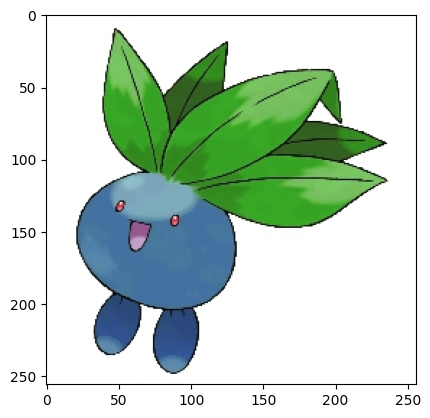

43.jpg


In [4]:
# Visualizamos un ejemplo de los datos, así como mostrar que número de imagen es
for img in os.listdir(DATADIR):
    img_array = cv2.imread(os.path.join(DATADIR, img))
    print("# name of the image: ", img)
    img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)
    plt.imshow(img_array)
    plt.show()
    print(img)
    break

In [6]:
# Redimensionamos las imagenes
batch_size = 128
IMG_HEIGHT = 256
IMG_WIDTH = 256

# Función de preprocesamiento para normalización y cambio de tamaño de imágenes
# En la version pasada se implementaron más funciones pero no fue necesario debido a que se usaron otra versión de los mismos datos y no se necesitaban
def preprocess_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    return image

# Cargar y preprocesar imágenes del directorio
image_paths = [os.path.join(DATADIR, img) for img in os.listdir(DATADIR)]
dataset = tf.data.Dataset.from_tensor_slices(image_paths)
dataset = dataset.map(tf.io.read_file)
dataset = dataset.map(preprocess_image)

# Hacemos los batches
dataset = dataset.batch(batch_size)

In [9]:
# Inicializador de pesos utilizando una distribución normal aleatoria
# Se utiliza para inicializar los pesos, lo que puede mejorar el entrenamiento.
init_weights_kernel = tf.keras.initializers.RandomNormal(mean = 0.0, stddev = 0.02)

In [10]:
def generator_model():
    model = tf.keras.Sequential()

    model.add(layers.Input(shape = (100, )))
    model.add(layers.Dense(16 * 16 * 256))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Reshape((16, 16, 256)))

    model.add(layers.Conv2DTranspose(128, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel , use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(64, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(32, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(3, kernel_size = 4, padding = 'same', strides = 2, activation = 'tanh',
                                     kernel_initializer = init_weights_kernel, use_bias = False))


    return model

In [11]:
generator = generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 65536)             6619136   
                                                                 
 batch_normalization (Batch  (None, 65536)             262144    
 Normalization)                                                  
                                                                 
 re_lu (ReLU)                (None, 65536)             0         
                                                                 
 reshape (Reshape)           (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 32, 32, 128)       524288    
 anspose)                                                        
                                                                 
 batch_normalization_1 (Bat  (None, 32, 32, 128)       5

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [12]:
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training = False)
generated_image.shape

TensorShape([1, 256, 256, 3])

In [14]:
def discriminator_model():
    model = tf.keras.Sequential()

    model.add(layers.Conv2D(32, kernel_size = 3, strides = 2, input_shape = (256, 256, 3), padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False ))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(64, kernel_size = 3, strides = 2, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.ZeroPadding2D(padding = ((0, 1), (0, 1))))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.25))

    model.add(layers.Conv2D(128, kernel_size = 3, strides = 2, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256, kernel_size = 3, strides=1, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation = 'sigmoid'))

    return model

In [15]:
discriminator = discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      864       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 32)      0         
                                                                 
 dropout (Dropout)           (None, 128, 128, 32)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18432     
                                                                 
 zero_padding2d (ZeroPaddin  (None, 65, 65, 64)        0         
 g2D)                                                            
                                                                 
 batch_normalization_4 (Bat  (None, 65, 65, 64)        256       
 chNormalization)                                     

In [16]:
output = discriminator(generated_image)
print (output)

tf.Tensor([[0.50000006]], shape=(1, 1), dtype=float32)


In [17]:
bce = tf.keras.losses.BinaryCrossentropy()

In [18]:
# Definimos la función de perdida.
def discriminator_loss(real_output, fake_output):

    real_loss = bce(tf.ones_like(real_output), real_output)
    fake_loss = bce(tf.zeros_like(fake_output), fake_output)

    total_loss = real_loss + fake_loss

    return total_loss

In [19]:
# Calcula la perdida del generador utilizando la función de perdida previamente definida.
def generator_loss(fake_output):
    gen_loss = bce(tf.ones_like(fake_output), fake_output)
    return gen_loss

In [20]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)

In [21]:
# Se intento implementar una cantidad de epocas amyor, sin embargo, la mejora del modelo no era significativa por lo que se decidio dejar en 500
#
epochs = 500
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [22]:
# Se uso esta funcion para ver las imagenes mientras va avanzando el entrenamiento del modelo
# Me sirvio mucho para entender como van mejorando los resultados y para darme cuenta que no hay una diferencia drastica con la cantidad de epocas.
def generate_and_plot_images(model, epoch, test_input):
    predictions = model(test_input, training = False)
    fig = plt.figure(figsize = (8, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i, :, :, :] * 0.5 + 0.5))
        plt.axis('off')
    plt.show()


In [23]:
# Esta función realiza un paso de entrenamiento para una iteracion.
# Toma un lote de imágenes reales como entrada y entrena tanto al generador como al discriminador en función de estas imágenes.

def train_step(images):
    noise = tf.random.normal([batch_size, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training = True)

        real_output = discriminator(images, training = True)
        fake_output = discriminator(generated_images, training = True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return (gen_loss, disc_loss, tf.reduce_mean(real_output), tf.reduce_mean(fake_output))


In [24]:
def train(dataset, epochs):

    gen_loss_list = []
    disc_loss_list = []

    real_score_list = []
    fake_score_list = []

    for epoch in tqdm(range(epochs)):
        start = time.time()
        num_batches = len(dataset)

        print(f'Training started with  epoch {epoch + 1} with {num_batches} batches..')

        total_gen_loss = 0
        total_disc_loss = 0
        for batch in dataset:
            generator_loss, discriminator_loss, real_score, fake_score = train_step(batch)

            total_gen_loss += generator_loss
            total_disc_loss += discriminator_loss

        mean_gen_loss = total_gen_loss / num_batches
        mean_disc_loss = total_disc_loss / num_batches

        print('Losses after epoch %5d: generator %.3f, discriminator %.3f,\
               real_score %.2f%%, fake_score %.2f%%'  %
              (epoch+1, generator_loss, discriminator_loss, real_score * 100, fake_score * 100))
        if (epoch) % 10 == 0:
            generate_and_plot_images(generator, epoch, seed)

        gen_loss_list.append(mean_gen_loss)
        disc_loss_list.append(mean_disc_loss)
        real_score_list.append(real_score)
        fake_score_list.append(fake_score)

        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))
    return  gen_loss_list, disc_loss_list, real_score_list, fake_score_list

  0%|          | 0/500 [00:00<?, ?it/s]

Training started with  epoch 1 with 7 batches..


Losses after epoch     1: generator 7.392, discriminator 0.053,               real_score 95.19%, fake_score 0.14%


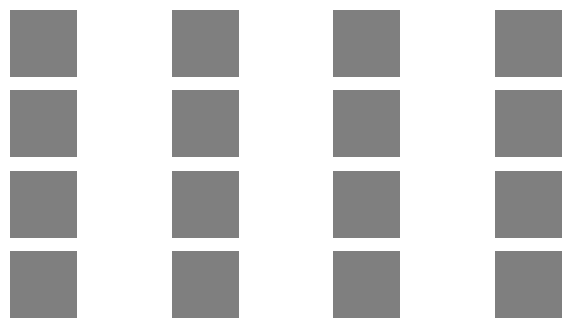

  0%|          | 1/500 [00:42<5:52:20, 42.37s/it]

Time for epoch 1 is 42.36497521400452 sec
Training started with  epoch 2 with 7 batches..


  0%|          | 2/500 [00:52<3:14:47, 23.47s/it]

Losses after epoch     2: generator 6.146, discriminator 0.255,               real_score 83.19%, fake_score 0.50%
Time for epoch 2 is 10.235745906829834 sec
Training started with  epoch 3 with 7 batches..


  1%|          | 3/500 [00:59<2:10:29, 15.75s/it]

Losses after epoch     3: generator 19.130, discriminator 0.187,               real_score 86.64%, fake_score 0.00%
Time for epoch 3 is 6.572905540466309 sec
Training started with  epoch 4 with 7 batches..


  1%|          | 4/500 [01:05<1:39:58, 12.09s/it]

Losses after epoch     4: generator 1.021, discriminator 0.695,               real_score 99.97%, fake_score 43.57%
Time for epoch 4 is 6.481213569641113 sec
Training started with  epoch 5 with 7 batches..


  1%|          | 5/500 [01:12<1:23:11, 10.08s/it]

Losses after epoch     5: generator 25.491, discriminator 1.713,               real_score 51.75%, fake_score 0.00%
Time for epoch 5 is 6.5195746421813965 sec
Training started with  epoch 6 with 7 batches..


  1%|          | 6/500 [01:18<1:12:53,  8.85s/it]

Losses after epoch     6: generator 6.540, discriminator 0.133,               real_score 94.78%, fake_score 0.39%
Time for epoch 6 is 6.460205554962158 sec
Training started with  epoch 7 with 7 batches..


  1%|▏         | 7/500 [01:28<1:16:26,  9.30s/it]

Losses after epoch     7: generator 10.634, discriminator 0.363,               real_score 87.50%, fake_score 0.01%
Time for epoch 7 is 10.232341527938843 sec
Training started with  epoch 8 with 7 batches..


  2%|▏         | 8/500 [01:39<1:18:43,  9.60s/it]

Losses after epoch     8: generator 5.400, discriminator 0.057,               real_score 97.39%, fake_score 0.89%
Time for epoch 8 is 10.233733415603638 sec
Training started with  epoch 9 with 7 batches..


  2%|▏         | 9/500 [01:49<1:20:11,  9.80s/it]

Losses after epoch     9: generator 4.954, discriminator 0.023,               real_score 99.59%, fake_score 1.77%
Time for epoch 9 is 10.234676599502563 sec
Training started with  epoch 10 with 7 batches..


  2%|▏         | 10/500 [01:55<1:11:46,  8.79s/it]

Losses after epoch    10: generator 0.768, discriminator 1.159,               real_score 97.10%, fake_score 55.91%
Time for epoch 10 is 6.526333332061768 sec
Training started with  epoch 11 with 7 batches..
Losses after epoch    11: generator 0.001, discriminator 8.283,               real_score 99.99%, fake_score 99.92%


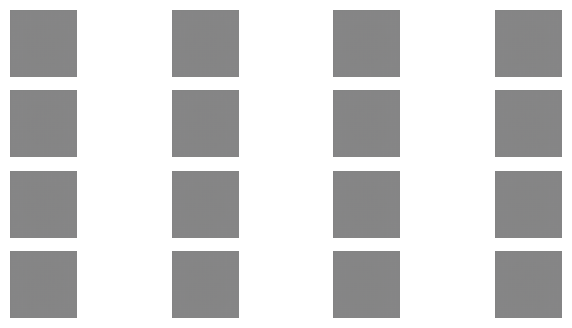

  2%|▏         | 11/500 [02:02<1:07:28,  8.28s/it]

Time for epoch 11 is 7.116964817047119 sec
Training started with  epoch 12 with 7 batches..


  2%|▏         | 12/500 [02:09<1:02:58,  7.74s/it]

Losses after epoch    12: generator 26.126, discriminator 8.303,               real_score 0.50%, fake_score 0.00%
Time for epoch 12 is 6.5177390575408936 sec
Training started with  epoch 13 with 7 batches..


  3%|▎         | 13/500 [02:16<1:00:05,  7.40s/it]

Losses after epoch    13: generator 26.043, discriminator 4.081,               real_score 18.29%, fake_score 0.00%
Time for epoch 13 is 6.622049808502197 sec
Training started with  epoch 14 with 7 batches..


  3%|▎         | 14/500 [02:22<57:50,  7.14s/it]  

Losses after epoch    14: generator 0.000, discriminator 8.987,               real_score 99.88%, fake_score 99.96%
Time for epoch 14 is 6.534441232681274 sec
Training started with  epoch 15 with 7 batches..


  3%|▎         | 15/500 [02:29<56:18,  6.97s/it]

Losses after epoch    15: generator 3.748, discriminator 0.063,               real_score 99.30%, fake_score 5.06%
Time for epoch 15 is 6.557863235473633 sec
Training started with  epoch 16 with 7 batches..


  3%|▎         | 16/500 [02:35<55:13,  6.85s/it]

Losses after epoch    16: generator 21.132, discriminator 0.378,               real_score 87.37%, fake_score 0.00%
Time for epoch 16 is 6.563983917236328 sec
Training started with  epoch 17 with 7 batches..


  3%|▎         | 17/500 [02:46<1:03:18,  7.86s/it]

Losses after epoch    17: generator 5.706, discriminator 0.161,               real_score 94.12%, fake_score 1.21%
Time for epoch 17 is 10.232764482498169 sec
Training started with  epoch 18 with 7 batches..


  4%|▎         | 18/500 [02:52<1:00:18,  7.51s/it]

Losses after epoch    18: generator 8.432, discriminator 0.007,               real_score 99.40%, fake_score 0.08%
Time for epoch 18 is 6.673617839813232 sec
Training started with  epoch 19 with 7 batches..


  4%|▍         | 19/500 [02:59<57:54,  7.22s/it]  

Losses after epoch    19: generator 23.144, discriminator 0.276,               real_score 90.34%, fake_score 0.00%
Time for epoch 19 is 6.559335947036743 sec
Training started with  epoch 20 with 7 batches..


  4%|▍         | 20/500 [03:09<1:05:01,  8.13s/it]

Losses after epoch    20: generator 12.341, discriminator 0.063,               real_score 95.49%, fake_score 0.00%
Time for epoch 20 is 10.232562780380249 sec
Training started with  epoch 21 with 7 batches..
Losses after epoch    21: generator 8.516, discriminator 0.001,               real_score 99.93%, fake_score 0.05%


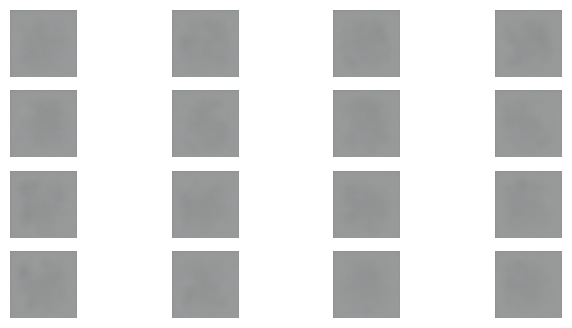

  4%|▍         | 21/500 [03:17<1:03:24,  7.94s/it]

Time for epoch 21 is 7.510188579559326 sec
Training started with  epoch 22 with 7 batches..


  4%|▍         | 22/500 [03:27<1:08:47,  8.64s/it]

Losses after epoch    22: generator 13.993, discriminator 0.188,               real_score 95.54%, fake_score 0.00%
Time for epoch 22 is 10.249436378479004 sec
Training started with  epoch 23 with 7 batches..


  5%|▍         | 23/500 [03:37<1:12:28,  9.12s/it]

Losses after epoch    23: generator 0.287, discriminator 3.137,               real_score 98.16%, fake_score 82.88%
Time for epoch 23 is 10.234224319458008 sec
Training started with  epoch 24 with 7 batches..


  5%|▍         | 24/500 [03:44<1:06:35,  8.39s/it]

Losses after epoch    24: generator 0.227, discriminator 4.678,               real_score 98.94%, fake_score 90.55%
Time for epoch 24 is 6.707852363586426 sec
Training started with  epoch 25 with 7 batches..


  5%|▌         | 25/500 [03:50<1:02:07,  7.85s/it]

Losses after epoch    25: generator 10.043, discriminator 0.445,               real_score 82.29%, fake_score 0.17%
Time for epoch 25 is 6.571116924285889 sec
Training started with  epoch 26 with 7 batches..


  5%|▌         | 26/500 [03:57<59:16,  7.50s/it]  

Losses after epoch    26: generator 8.183, discriminator 2.020,               real_score 39.79%, fake_score 0.22%
Time for epoch 26 is 6.701171636581421 sec
Training started with  epoch 27 with 7 batches..


  5%|▌         | 27/500 [04:04<57:04,  7.24s/it]

Losses after epoch    27: generator 0.477, discriminator 1.934,               real_score 98.84%, fake_score 70.19%
Time for epoch 27 is 6.624267816543579 sec
Training started with  epoch 28 with 7 batches..


  6%|▌         | 28/500 [04:10<55:43,  7.08s/it]

Losses after epoch    28: generator 2.918, discriminator 0.343,               real_score 93.82%, fake_score 16.19%
Time for epoch 28 is 6.716506004333496 sec
Training started with  epoch 29 with 7 batches..


  6%|▌         | 29/500 [04:17<54:25,  6.93s/it]

Losses after epoch    29: generator 4.229, discriminator 0.270,               real_score 91.85%, fake_score 10.04%
Time for epoch 29 is 6.583729028701782 sec
Training started with  epoch 30 with 7 batches..


  6%|▌         | 30/500 [04:24<53:42,  6.86s/it]

Losses after epoch    30: generator 0.703, discriminator 1.671,               real_score 97.88%, fake_score 61.76%
Time for epoch 30 is 6.670450925827026 sec
Training started with  epoch 31 with 7 batches..
Losses after epoch    31: generator 0.279, discriminator 2.759,               real_score 99.84%, fake_score 82.02%


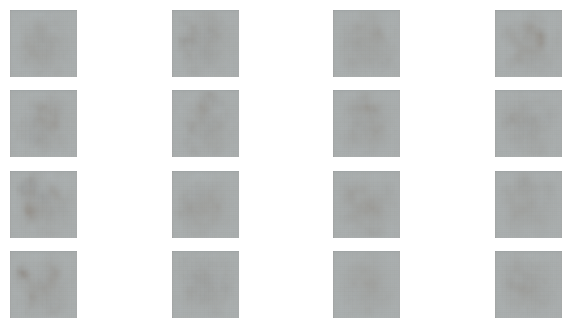

  6%|▌         | 31/500 [04:35<1:03:20,  8.10s/it]

Time for epoch 31 is 11.014081478118896 sec
Training started with  epoch 32 with 7 batches..


  6%|▋         | 32/500 [04:45<1:08:14,  8.75s/it]

Losses after epoch    32: generator 10.075, discriminator 0.618,               real_score 71.34%, fake_score 0.07%
Time for epoch 32 is 10.251623392105103 sec
Training started with  epoch 33 with 7 batches..


  7%|▋         | 33/500 [04:55<1:11:35,  9.20s/it]

Losses after epoch    33: generator 2.494, discriminator 0.272,               real_score 98.86%, fake_score 18.83%
Time for epoch 33 is 10.243629455566406 sec
Training started with  epoch 34 with 7 batches..


  7%|▋         | 34/500 [05:05<1:13:51,  9.51s/it]

Losses after epoch    34: generator 17.246, discriminator 5.553,               real_score 2.46%, fake_score 0.00%
Time for epoch 34 is 10.235347747802734 sec
Training started with  epoch 35 with 7 batches..


  7%|▋         | 35/500 [05:16<1:15:23,  9.73s/it]

Losses after epoch    35: generator 2.592, discriminator 0.508,               real_score 84.00%, fake_score 18.92%
Time for epoch 35 is 10.234444379806519 sec
Training started with  epoch 36 with 7 batches..


  7%|▋         | 36/500 [05:22<1:08:11,  8.82s/it]

Losses after epoch    36: generator 0.393, discriminator 2.527,               real_score 100.00%, fake_score 77.53%
Time for epoch 36 is 6.693424224853516 sec
Training started with  epoch 37 with 7 batches..


  7%|▋         | 37/500 [05:29<1:03:23,  8.22s/it]

Losses after epoch    37: generator 4.851, discriminator 1.261,               real_score 56.29%, fake_score 2.47%
Time for epoch 37 is 6.800726652145386 sec
Training started with  epoch 38 with 7 batches..


  8%|▊         | 38/500 [05:39<1:07:55,  8.82s/it]

Losses after epoch    38: generator 0.436, discriminator 2.497,               real_score 99.96%, fake_score 76.83%
Time for epoch 38 is 10.235740184783936 sec
Training started with  epoch 39 with 7 batches..


  8%|▊         | 39/500 [05:46<1:02:44,  8.17s/it]

Losses after epoch    39: generator 2.863, discriminator 0.228,               real_score 98.70%, fake_score 15.42%
Time for epoch 39 is 6.632315397262573 sec
Training started with  epoch 40 with 7 batches..


  8%|▊         | 40/500 [05:53<59:18,  7.74s/it]  

Losses after epoch    40: generator 7.757, discriminator 3.718,               real_score 11.67%, fake_score 0.16%
Time for epoch 40 is 6.731400728225708 sec
Training started with  epoch 41 with 7 batches..
Losses after epoch    41: generator 2.456, discriminator 0.303,               real_score 97.80%, fake_score 20.10%


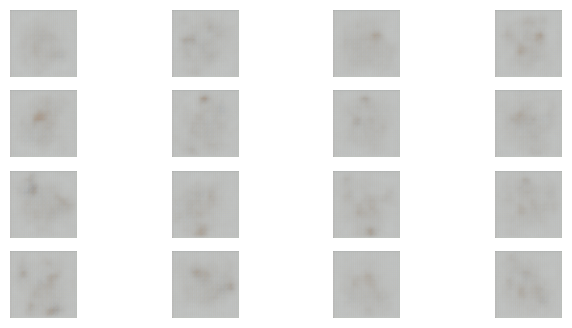

  8%|▊         | 41/500 [06:03<1:06:13,  8.66s/it]

Time for epoch 41 is 10.800198316574097 sec
Training started with  epoch 42 with 7 batches..


  8%|▊         | 42/500 [06:14<1:09:42,  9.13s/it]

Losses after epoch    42: generator 19.344, discriminator 6.170,               real_score 5.06%, fake_score 0.00%
Time for epoch 42 is 10.237279653549194 sec
Training started with  epoch 43 with 7 batches..


  9%|▊         | 43/500 [06:20<1:03:55,  8.39s/it]

Losses after epoch    43: generator 7.097, discriminator 0.121,               real_score 92.33%, fake_score 0.60%
Time for epoch 43 is 6.667953968048096 sec
Training started with  epoch 44 with 7 batches..


  9%|▉         | 44/500 [06:27<59:53,  7.88s/it]  

Losses after epoch    44: generator 8.441, discriminator 0.002,               real_score 99.84%, fake_score 0.07%
Time for epoch 44 is 6.6796581745147705 sec
Training started with  epoch 45 with 7 batches..


  9%|▉         | 45/500 [06:37<1:05:06,  8.59s/it]

Losses after epoch    45: generator 0.010, discriminator 6.388,               real_score 99.99%, fake_score 99.02%
Time for epoch 45 is 10.233116626739502 sec
Training started with  epoch 46 with 7 batches..


  9%|▉         | 46/500 [06:44<1:00:58,  8.06s/it]

Losses after epoch    46: generator 0.946, discriminator 1.464,               real_score 99.44%, fake_score 57.88%
Time for epoch 46 is 6.822220325469971 sec
Training started with  epoch 47 with 7 batches..


  9%|▉         | 47/500 [06:51<57:50,  7.66s/it]  

Losses after epoch    47: generator 3.940, discriminator 0.335,               real_score 85.15%, fake_score 7.14%
Time for epoch 47 is 6.736041784286499 sec
Training started with  epoch 48 with 7 batches..


 10%|▉         | 48/500 [06:58<55:42,  7.39s/it]

Losses after epoch    48: generator 3.591, discriminator 0.171,               real_score 99.82%, fake_score 11.21%
Time for epoch 48 is 6.7656636238098145 sec
Training started with  epoch 49 with 7 batches..


 10%|▉         | 49/500 [07:04<54:07,  7.20s/it]

Losses after epoch    49: generator 22.749, discriminator 0.859,               real_score 59.70%, fake_score 0.00%
Time for epoch 49 is 6.751070499420166 sec
Training started with  epoch 50 with 7 batches..


 10%|█         | 50/500 [07:15<1:00:51,  8.11s/it]

Losses after epoch    50: generator 13.249, discriminator 2.618,               real_score 22.08%, fake_score 0.00%
Time for epoch 50 is 10.240981340408325 sec
Training started with  epoch 51 with 7 batches..
Losses after epoch    51: generator 1.881, discriminator 0.480,               real_score 99.59%, fake_score 28.89%


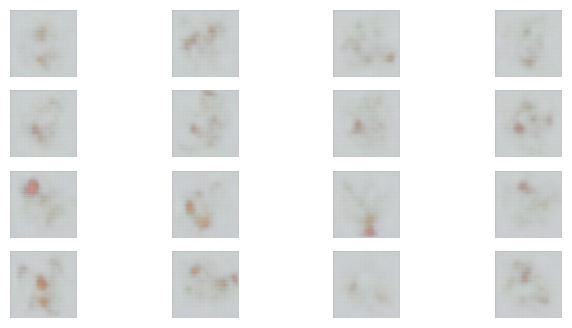

 10%|█         | 51/500 [07:22<59:13,  7.92s/it]  

Time for epoch 51 is 7.447076320648193 sec
Training started with  epoch 52 with 7 batches..


 10%|█         | 52/500 [07:32<1:04:18,  8.61s/it]

Losses after epoch    52: generator 1.328, discriminator 0.701,               real_score 98.65%, fake_score 39.29%
Time for epoch 52 is 10.23816967010498 sec
Training started with  epoch 53 with 7 batches..


 11%|█         | 53/500 [07:43<1:07:47,  9.10s/it]

Losses after epoch    53: generator 4.237, discriminator 0.252,               real_score 91.73%, fake_score 5.09%
Time for epoch 53 is 10.236294507980347 sec
Training started with  epoch 54 with 7 batches..


 11%|█         | 54/500 [07:53<1:10:10,  9.44s/it]

Losses after epoch    54: generator 5.922, discriminator 0.015,               real_score 99.87%, fake_score 1.27%
Time for epoch 54 is 10.234403610229492 sec
Training started with  epoch 55 with 7 batches..


 11%|█         | 55/500 [08:03<1:11:49,  9.68s/it]

Losses after epoch    55: generator 13.448, discriminator 6.781,               real_score 0.96%, fake_score 0.00%
Time for epoch 55 is 10.248367309570312 sec
Training started with  epoch 56 with 7 batches..


 11%|█         | 56/500 [08:10<1:05:10,  8.81s/it]

Losses after epoch    56: generator 1.964, discriminator 0.680,               real_score 99.20%, fake_score 34.35%
Time for epoch 56 is 6.763183116912842 sec
Training started with  epoch 57 with 7 batches..


 11%|█▏        | 57/500 [08:16<1:00:10,  8.15s/it]

Losses after epoch    57: generator 0.994, discriminator 1.601,               real_score 99.61%, fake_score 58.27%
Time for epoch 57 is 6.615900754928589 sec
Training started with  epoch 58 with 7 batches..


 12%|█▏        | 58/500 [08:27<1:04:39,  8.78s/it]

Losses after epoch    58: generator 3.204, discriminator 0.399,               real_score 89.02%, fake_score 14.21%
Time for epoch 58 is 10.235063314437866 sec
Training started with  epoch 59 with 7 batches..


 12%|█▏        | 59/500 [08:37<1:07:43,  9.21s/it]

Losses after epoch    59: generator 3.645, discriminator 0.198,               real_score 99.40%, fake_score 13.15%
Time for epoch 59 is 10.23618197441101 sec
Training started with  epoch 60 with 7 batches..


 12%|█▏        | 60/500 [08:44<1:02:11,  8.48s/it]

Losses after epoch    60: generator 13.251, discriminator 3.374,               real_score 11.38%, fake_score 0.00%
Time for epoch 60 is 6.7696709632873535 sec
Training started with  epoch 61 with 7 batches..
Losses after epoch    61: generator 3.476, discriminator 0.148,               real_score 95.78%, fake_score 8.28%


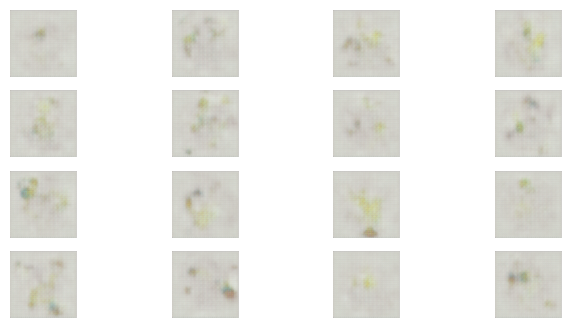

 12%|█▏        | 61/500 [08:54<1:07:07,  9.17s/it]

Time for epoch 61 is 10.788274765014648 sec
Training started with  epoch 62 with 7 batches..


 12%|█▏        | 62/500 [09:05<1:09:18,  9.49s/it]

Losses after epoch    62: generator 3.281, discriminator 0.168,               real_score 99.97%, fake_score 10.97%
Time for epoch 62 is 10.23487901687622 sec
Training started with  epoch 63 with 7 batches..


 13%|█▎        | 63/500 [09:12<1:03:14,  8.68s/it]

Losses after epoch    63: generator 14.883, discriminator 6.215,               real_score 1.37%, fake_score 0.00%
Time for epoch 63 is 6.7873148918151855 sec
Training started with  epoch 64 with 7 batches..


 13%|█▎        | 64/500 [09:18<58:37,  8.07s/it]  

Losses after epoch    64: generator 0.973, discriminator 1.291,               real_score 99.63%, fake_score 55.57%
Time for epoch 64 is 6.636024475097656 sec
Training started with  epoch 65 with 7 batches..


 13%|█▎        | 65/500 [09:28<1:03:13,  8.72s/it]

Losses after epoch    65: generator 7.019, discriminator 0.130,               real_score 92.30%, fake_score 0.79%
Time for epoch 65 is 10.240438461303711 sec
Training started with  epoch 66 with 7 batches..


 13%|█▎        | 66/500 [09:35<58:45,  8.12s/it]  

Losses after epoch    66: generator 6.215, discriminator 0.010,               real_score 99.98%, fake_score 0.97%
Time for epoch 66 is 6.725899934768677 sec
Training started with  epoch 67 with 7 batches..


 13%|█▎        | 67/500 [09:45<1:03:14,  8.76s/it]

Losses after epoch    67: generator 2.134, discriminator 0.444,               real_score 99.83%, fake_score 26.38%
Time for epoch 67 is 10.250327348709106 sec
Training started with  epoch 68 with 7 batches..


 14%|█▎        | 68/500 [09:52<58:44,  8.16s/it]  

Losses after epoch    68: generator 1.113, discriminator 0.907,               real_score 99.99%, fake_score 46.44%
Time for epoch 68 is 6.746116638183594 sec
Training started with  epoch 69 with 7 batches..


 14%|█▍        | 69/500 [10:02<1:03:05,  8.78s/it]

Losses after epoch    69: generator 18.285, discriminator 0.597,               real_score 65.34%, fake_score 0.00%
Time for epoch 69 is 10.235440492630005 sec
Training started with  epoch 70 with 7 batches..


 14%|█▍        | 70/500 [10:09<58:26,  8.16s/it]  

Losses after epoch    70: generator 5.025, discriminator 0.103,               real_score 94.21%, fake_score 2.84%
Time for epoch 70 is 6.69282603263855 sec
Training started with  epoch 71 with 7 batches..
Losses after epoch    71: generator 9.392, discriminator 0.019,               real_score 98.30%, fake_score 0.13%


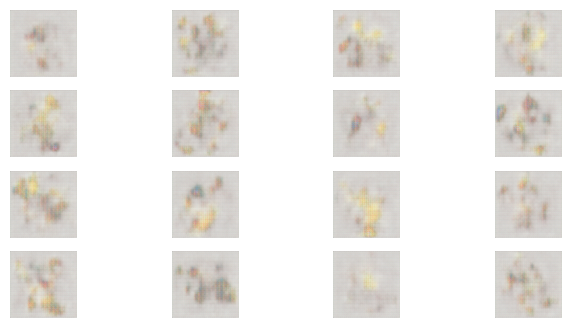

 14%|█▍        | 71/500 [10:16<56:28,  7.90s/it]

Time for epoch 71 is 7.294604301452637 sec
Training started with  epoch 72 with 7 batches..


 14%|█▍        | 72/500 [10:27<1:01:21,  8.60s/it]

Losses after epoch    72: generator 0.182, discriminator 3.298,               real_score 99.99%, fake_score 86.86%
Time for epoch 72 is 10.23555612564087 sec
Training started with  epoch 73 with 7 batches..


 15%|█▍        | 73/500 [10:37<1:04:42,  9.09s/it]

Losses after epoch    73: generator 1.509, discriminator 0.720,               real_score 99.93%, fake_score 37.99%
Time for epoch 73 is 10.236136436462402 sec
Training started with  epoch 74 with 7 batches..


 15%|█▍        | 74/500 [10:44<59:51,  8.43s/it]  

Losses after epoch    74: generator 9.295, discriminator 0.012,               real_score 98.90%, fake_score 0.07%
Time for epoch 74 is 6.882847309112549 sec
Training started with  epoch 75 with 7 batches..


 15%|█▌        | 75/500 [10:50<55:59,  7.90s/it]

Losses after epoch    75: generator 2.374, discriminator 0.242,               real_score 99.98%, fake_score 18.31%
Time for epoch 75 is 6.674022197723389 sec
Training started with  epoch 76 with 7 batches..


 15%|█▌        | 76/500 [11:01<1:00:50,  8.61s/it]

Losses after epoch    76: generator 1.342, discriminator 0.779,               real_score 99.12%, fake_score 41.18%
Time for epoch 76 is 10.252334356307983 sec
Training started with  epoch 77 with 7 batches..


 15%|█▌        | 77/500 [11:07<56:48,  8.06s/it]  

Losses after epoch    77: generator 6.842, discriminator 0.013,               real_score 99.40%, fake_score 0.69%
Time for epoch 77 is 6.767345905303955 sec
Training started with  epoch 78 with 7 batches..


 16%|█▌        | 78/500 [11:14<53:40,  7.63s/it]

Losses after epoch    78: generator 4.145, discriminator 0.070,               real_score 98.66%, fake_score 4.79%
Time for epoch 78 is 6.639609098434448 sec
Training started with  epoch 79 with 7 batches..


 16%|█▌        | 79/500 [11:24<59:02,  8.41s/it]

Losses after epoch    79: generator 7.510, discriminator 0.870,               real_score 58.75%, fake_score 0.20%
Time for epoch 79 is 10.239145040512085 sec
Training started with  epoch 80 with 7 batches..


 16%|█▌        | 80/500 [11:35<1:02:44,  8.96s/it]

Losses after epoch    80: generator 2.528, discriminator 0.269,               real_score 99.98%, fake_score 18.97%
Time for epoch 80 is 10.23753046989441 sec
Training started with  epoch 81 with 7 batches..
Losses after epoch    81: generator 2.599, discriminator 0.241,               real_score 100.00%, fake_score 17.69%


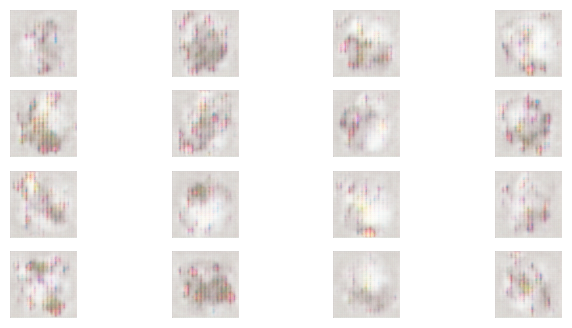

 16%|█▌        | 81/500 [11:42<1:00:18,  8.64s/it]

Time for epoch 81 is 7.87384819984436 sec
Training started with  epoch 82 with 7 batches..


 16%|█▋        | 82/500 [11:53<1:03:31,  9.12s/it]

Losses after epoch    82: generator 4.252, discriminator 0.048,               real_score 99.29%, fake_score 3.77%
Time for epoch 82 is 10.241708755493164 sec
Training started with  epoch 83 with 7 batches..


 17%|█▋        | 83/500 [11:59<58:26,  8.41s/it]  

Losses after epoch    83: generator 6.837, discriminator 0.251,               real_score 83.18%, fake_score 0.45%
Time for epoch 83 is 6.754030704498291 sec
Training started with  epoch 84 with 7 batches..


 17%|█▋        | 84/500 [12:10<1:02:06,  8.96s/it]

Losses after epoch    84: generator 16.408, discriminator 1.796,               real_score 30.83%, fake_score 0.00%
Time for epoch 84 is 10.2342050075531 sec
Training started with  epoch 85 with 7 batches..


 17%|█▋        | 85/500 [12:16<57:15,  8.28s/it]  

Losses after epoch    85: generator 5.844, discriminator 0.338,               real_score 78.30%, fake_score 2.92%
Time for epoch 85 is 6.693192005157471 sec
Training started with  epoch 86 with 7 batches..


 17%|█▋        | 86/500 [12:27<1:01:10,  8.87s/it]

Losses after epoch    86: generator 3.664, discriminator 0.134,               real_score 99.62%, fake_score 10.10%
Time for epoch 86 is 10.232846975326538 sec
Training started with  epoch 87 with 7 batches..


 17%|█▋        | 87/500 [12:37<1:03:51,  9.28s/it]

Losses after epoch    87: generator 0.192, discriminator 2.909,               real_score 100.00%, fake_score 85.75%
Time for epoch 87 is 10.23539924621582 sec
Training started with  epoch 88 with 7 batches..


 18%|█▊        | 88/500 [12:47<1:05:40,  9.57s/it]

Losses after epoch    88: generator 9.313, discriminator 0.008,               real_score 99.27%, fake_score 0.05%
Time for epoch 88 is 10.236323595046997 sec
Training started with  epoch 89 with 7 batches..


 18%|█▊        | 89/500 [12:57<1:06:54,  9.77s/it]

Losses after epoch    89: generator 0.732, discriminator 1.332,               real_score 100.00%, fake_score 59.72%
Time for epoch 89 is 10.237775087356567 sec
Training started with  epoch 90 with 7 batches..


 18%|█▊        | 90/500 [13:08<1:07:42,  9.91s/it]

Losses after epoch    90: generator 6.217, discriminator 0.013,               real_score 99.46%, fake_score 0.76%
Time for epoch 90 is 10.23924970626831 sec
Training started with  epoch 91 with 7 batches..
Losses after epoch    91: generator 4.787, discriminator 0.047,               real_score 99.98%, fake_score 4.05%


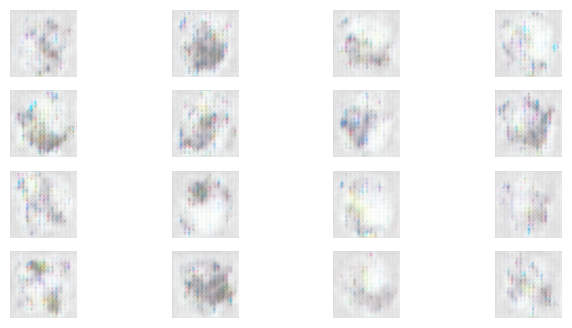

 18%|█▊        | 91/500 [13:15<1:02:10,  9.12s/it]

Time for epoch 91 is 7.27609395980835 sec
Training started with  epoch 92 with 7 batches..


 18%|█▊        | 92/500 [13:25<1:04:18,  9.46s/it]

Losses after epoch    92: generator 1.154, discriminator 0.974,               real_score 99.87%, fake_score 46.70%
Time for epoch 92 is 10.237917184829712 sec
Training started with  epoch 93 with 7 batches..


 19%|█▊        | 93/500 [13:35<1:05:44,  9.69s/it]

Losses after epoch    93: generator 0.823, discriminator 1.665,               real_score 100.00%, fake_score 62.96%
Time for epoch 93 is 10.237164497375488 sec
Training started with  epoch 94 with 7 batches..


 19%|█▉        | 94/500 [13:42<59:27,  8.79s/it]  

Losses after epoch    94: generator 10.988, discriminator 0.011,               real_score 99.07%, fake_score 0.03%
Time for epoch 94 is 6.678248882293701 sec
Training started with  epoch 95 with 7 batches..


 19%|█▉        | 95/500 [13:49<55:09,  8.17s/it]

Losses after epoch    95: generator 18.506, discriminator 0.097,               real_score 91.83%, fake_score 0.00%
Time for epoch 95 is 6.730604410171509 sec
Training started with  epoch 96 with 7 batches..


 19%|█▉        | 96/500 [13:55<51:57,  7.72s/it]

Losses after epoch    96: generator 10.146, discriminator 0.520,               real_score 79.25%, fake_score 0.02%
Time for epoch 96 is 6.6530046463012695 sec
Training started with  epoch 97 with 7 batches..


 19%|█▉        | 97/500 [14:06<56:54,  8.47s/it]

Losses after epoch    97: generator 8.561, discriminator 0.002,               real_score 99.86%, fake_score 0.08%
Time for epoch 97 is 10.233940362930298 sec
Training started with  epoch 98 with 7 batches..


 20%|█▉        | 98/500 [14:16<1:00:18,  9.00s/it]

Losses after epoch    98: generator 5.004, discriminator 0.207,               real_score 87.34%, fake_score 3.80%
Time for epoch 98 is 10.236762523651123 sec
Training started with  epoch 99 with 7 batches..


 20%|█▉        | 99/500 [14:23<55:32,  8.31s/it]  

Losses after epoch    99: generator 5.738, discriminator 0.024,               real_score 99.86%, fake_score 1.95%
Time for epoch 99 is 6.696626424789429 sec
Training started with  epoch 100 with 7 batches..


 20%|██        | 100/500 [14:29<52:16,  7.84s/it]

Losses after epoch   100: generator 3.003, discriminator 0.232,               real_score 96.91%, fake_score 14.29%
Time for epoch 100 is 6.743537425994873 sec
Training started with  epoch 101 with 7 batches..
Losses after epoch   101: generator 8.879, discriminator 0.077,               real_score 93.23%, fake_score 0.09%


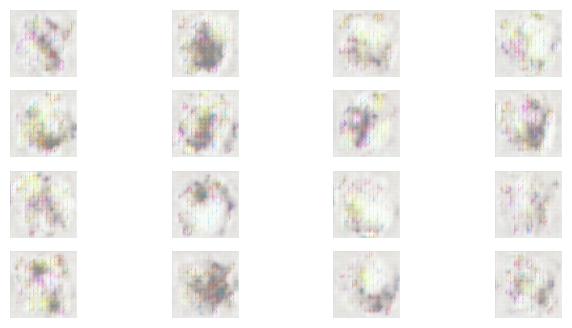

 20%|██        | 101/500 [14:37<51:30,  7.75s/it]

Time for epoch 101 is 7.5203821659088135 sec
Training started with  epoch 102 with 7 batches..


 20%|██        | 102/500 [14:47<56:23,  8.50s/it]

Losses after epoch   102: generator 4.649, discriminator 0.063,               real_score 99.82%, fake_score 5.02%
Time for epoch 102 is 10.260841131210327 sec
Training started with  epoch 103 with 7 batches..


 21%|██        | 103/500 [14:54<52:54,  8.00s/it]

Losses after epoch   103: generator 6.151, discriminator 0.016,               real_score 100.00%, fake_score 1.48%
Time for epoch 103 is 6.819002866744995 sec
Training started with  epoch 104 with 7 batches..


 21%|██        | 104/500 [15:01<50:07,  7.59s/it]

Losses after epoch   104: generator 0.483, discriminator 1.952,               real_score 100.00%, fake_score 72.15%
Time for epoch 104 is 6.650345325469971 sec
Training started with  epoch 105 with 7 batches..


 21%|██        | 105/500 [15:11<55:12,  8.39s/it]

Losses after epoch   105: generator 7.928, discriminator 0.204,               real_score 85.32%, fake_score 0.21%
Time for epoch 105 is 10.235349893569946 sec
Training started with  epoch 106 with 7 batches..


 21%|██        | 106/500 [15:18<51:57,  7.91s/it]

Losses after epoch   106: generator 3.757, discriminator 0.126,               real_score 96.22%, fake_score 7.42%
Time for epoch 106 is 6.803014516830444 sec
Training started with  epoch 107 with 7 batches..


 21%|██▏       | 107/500 [15:24<49:26,  7.55s/it]

Losses after epoch   107: generator 0.491, discriminator 1.783,               real_score 99.95%, fake_score 69.42%
Time for epoch 107 is 6.698445081710815 sec
Training started with  epoch 108 with 7 batches..


 22%|██▏       | 108/500 [15:31<47:43,  7.31s/it]

Losses after epoch   108: generator 4.778, discriminator 0.035,               real_score 99.90%, fake_score 2.94%
Time for epoch 108 is 6.737440347671509 sec
Training started with  epoch 109 with 7 batches..


 22%|██▏       | 109/500 [15:38<46:24,  7.12s/it]

Losses after epoch   109: generator 11.168, discriminator 0.006,               real_score 99.49%, fake_score 0.03%
Time for epoch 109 is 6.692506790161133 sec
Training started with  epoch 110 with 7 batches..


 22%|██▏       | 110/500 [15:45<45:40,  7.03s/it]

Losses after epoch   110: generator 4.864, discriminator 0.039,               real_score 100.00%, fake_score 3.39%
Time for epoch 110 is 6.804019451141357 sec
Training started with  epoch 111 with 7 batches..
Losses after epoch   111: generator 0.654, discriminator 1.670,               real_score 100.00%, fake_score 65.29%


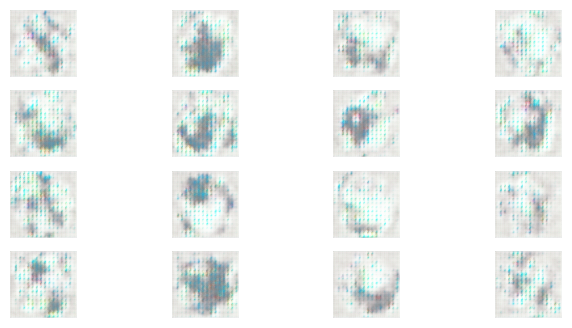

 22%|██▏       | 111/500 [15:55<53:12,  8.21s/it]

Time for epoch 111 is 10.962049007415771 sec
Training started with  epoch 112 with 7 batches..


 22%|██▏       | 112/500 [16:02<50:20,  7.78s/it]

Losses after epoch   112: generator 0.119, discriminator 4.111,               real_score 99.60%, fake_score 91.54%
Time for epoch 112 is 6.793195009231567 sec
Training started with  epoch 113 with 7 batches..


 23%|██▎       | 113/500 [16:09<48:15,  7.48s/it]

Losses after epoch   113: generator 1.756, discriminator 0.569,               real_score 99.98%, fake_score 32.02%
Time for epoch 113 is 6.77131462097168 sec
Training started with  epoch 114 with 7 batches..


 23%|██▎       | 114/500 [16:19<53:26,  8.31s/it]

Losses after epoch   114: generator 13.608, discriminator 0.551,               real_score 70.01%, fake_score 0.00%
Time for epoch 114 is 10.237318754196167 sec
Training started with  epoch 115 with 7 batches..


 23%|██▎       | 115/500 [16:30<57:02,  8.89s/it]

Losses after epoch   115: generator 7.961, discriminator 0.137,               real_score 89.00%, fake_score 0.28%
Time for epoch 115 is 10.24323296546936 sec
Training started with  epoch 116 with 7 batches..


 23%|██▎       | 116/500 [16:36<52:51,  8.26s/it]

Losses after epoch   116: generator 7.343, discriminator 0.006,               real_score 100.00%, fake_score 0.56%
Time for epoch 116 is 6.7896575927734375 sec
Training started with  epoch 117 with 7 batches..


 23%|██▎       | 117/500 [16:47<56:31,  8.85s/it]

Losses after epoch   117: generator 6.525, discriminator 0.355,               real_score 76.00%, fake_score 0.65%
Time for epoch 117 is 10.237215280532837 sec
Training started with  epoch 118 with 7 batches..


 24%|██▎       | 118/500 [16:57<59:00,  9.27s/it]

Losses after epoch   118: generator 3.475, discriminator 0.116,               real_score 98.82%, fake_score 8.58%
Time for epoch 118 is 10.237188816070557 sec
Training started with  epoch 119 with 7 batches..


 24%|██▍       | 119/500 [17:07<1:00:42,  9.56s/it]

Losses after epoch   119: generator 3.525, discriminator 0.119,               real_score 97.26%, fake_score 7.32%
Time for epoch 119 is 10.236889362335205 sec
Training started with  epoch 120 with 7 batches..


 24%|██▍       | 120/500 [17:17<1:01:50,  9.77s/it]

Losses after epoch   120: generator 11.786, discriminator 2.095,               real_score 22.95%, fake_score 0.00%
Time for epoch 120 is 10.241069316864014 sec
Training started with  epoch 121 with 7 batches..
Losses after epoch   121: generator 1.365, discriminator 1.156,               real_score 99.60%, fake_score 45.55%


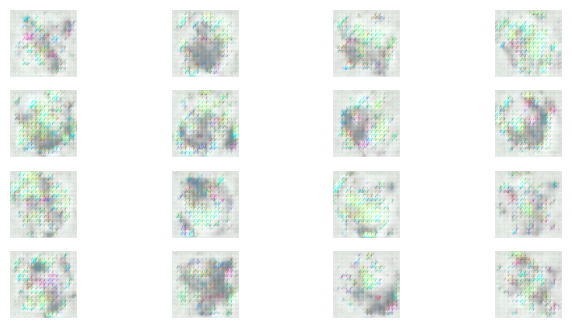

 24%|██▍       | 121/500 [17:28<1:04:05, 10.15s/it]

Time for epoch 121 is 11.03546953201294 sec
Training started with  epoch 122 with 7 batches..


 24%|██▍       | 122/500 [17:39<1:04:05, 10.17s/it]

Losses after epoch   122: generator 16.657, discriminator 0.150,               real_score 90.08%, fake_score 0.00%
Time for epoch 122 is 10.235635757446289 sec
Training started with  epoch 123 with 7 batches..


 25%|██▍       | 123/500 [17:45<57:18,  9.12s/it]  

Losses after epoch   123: generator 8.450, discriminator 0.030,               real_score 97.35%, fake_score 0.12%
Time for epoch 123 is 6.660721778869629 sec
Training started with  epoch 124 with 7 batches..


 25%|██▍       | 124/500 [17:55<59:15,  9.46s/it]

Losses after epoch   124: generator 5.222, discriminator 0.194,               real_score 87.18%, fake_score 1.87%
Time for epoch 124 is 10.235708236694336 sec
Training started with  epoch 125 with 7 batches..


 25%|██▌       | 125/500 [18:06<1:00:33,  9.69s/it]

Losses after epoch   125: generator 7.184, discriminator 0.010,               real_score 99.62%, fake_score 0.60%
Time for epoch 125 is 10.236402034759521 sec
Training started with  epoch 126 with 7 batches..


 25%|██▌       | 126/500 [18:12<54:54,  8.81s/it]  

Losses after epoch   126: generator 4.580, discriminator 0.248,               real_score 88.16%, fake_score 4.45%
Time for epoch 126 is 6.747257471084595 sec
Training started with  epoch 127 with 7 batches..


 25%|██▌       | 127/500 [18:23<57:26,  9.24s/it]

Losses after epoch   127: generator 12.499, discriminator 0.111,               real_score 91.29%, fake_score 0.00%
Time for epoch 127 is 10.241113424301147 sec
Training started with  epoch 128 with 7 batches..


 26%|██▌       | 128/500 [18:33<59:08,  9.54s/it]

Losses after epoch   128: generator 12.331, discriminator 1.826,               real_score 26.16%, fake_score 0.00%
Time for epoch 128 is 10.235974550247192 sec
Training started with  epoch 129 with 7 batches..


 26%|██▌       | 129/500 [18:40<53:44,  8.69s/it]

Losses after epoch   129: generator 4.609, discriminator 0.054,               real_score 98.62%, fake_score 3.45%
Time for epoch 129 is 6.714493989944458 sec
Training started with  epoch 130 with 7 batches..


 26%|██▌       | 130/500 [18:46<49:56,  8.10s/it]

Losses after epoch   130: generator 4.919, discriminator 0.037,               real_score 99.04%, fake_score 2.44%
Time for epoch 130 is 6.715311527252197 sec
Training started with  epoch 131 with 7 batches..
Losses after epoch   131: generator 3.683, discriminator 0.096,               real_score 99.21%, fake_score 7.43%


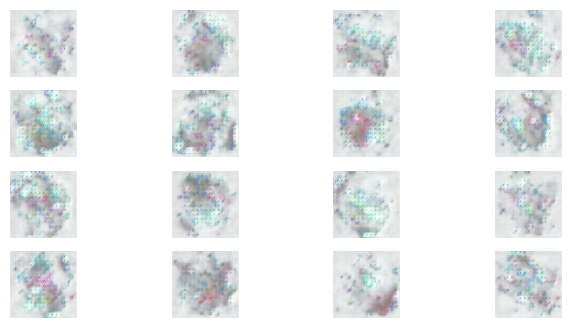

 26%|██▌       | 131/500 [18:54<48:20,  7.86s/it]

Time for epoch 131 is 7.296645402908325 sec
Training started with  epoch 132 with 7 batches..


 26%|██▋       | 132/500 [19:04<52:35,  8.57s/it]

Losses after epoch   132: generator 4.100, discriminator 0.109,               real_score 95.82%, fake_score 5.17%
Time for epoch 132 is 10.241370439529419 sec
Training started with  epoch 133 with 7 batches..


 27%|██▋       | 133/500 [19:14<55:30,  9.07s/it]

Losses after epoch   133: generator 5.660, discriminator 0.022,               real_score 100.00%, fake_score 2.04%
Time for epoch 133 is 10.236017942428589 sec
Training started with  epoch 134 with 7 batches..


 27%|██▋       | 134/500 [19:24<57:28,  9.42s/it]

Losses after epoch   134: generator 2.079, discriminator 0.470,               real_score 95.53%, fake_score 25.72%
Time for epoch 134 is 10.234632730484009 sec
Training started with  epoch 135 with 7 batches..


 27%|██▋       | 135/500 [19:31<52:29,  8.63s/it]

Losses after epoch   135: generator 7.294, discriminator 0.008,               real_score 100.00%, fake_score 0.76%
Time for epoch 135 is 6.775247573852539 sec
Training started with  epoch 136 with 7 batches..


 27%|██▋       | 136/500 [19:41<55:17,  9.11s/it]

Losses after epoch   136: generator 3.777, discriminator 0.087,               real_score 99.97%, fake_score 7.28%
Time for epoch 136 is 10.238219499588013 sec
Training started with  epoch 137 with 7 batches..


 27%|██▋       | 137/500 [19:48<50:59,  8.43s/it]

Losses after epoch   137: generator 0.147, discriminator 3.644,               real_score 100.00%, fake_score 89.79%
Time for epoch 137 is 6.823355197906494 sec
Training started with  epoch 138 with 7 batches..


 28%|██▊       | 138/500 [19:55<47:41,  7.91s/it]

Losses after epoch   138: generator 17.656, discriminator 0.468,               real_score 69.78%, fake_score 0.00%
Time for epoch 138 is 6.6843390464782715 sec
Training started with  epoch 139 with 7 batches..


 28%|██▊       | 139/500 [20:05<51:47,  8.61s/it]

Losses after epoch   139: generator 24.287, discriminator 18.417,               real_score 0.00%, fake_score 0.00%
Time for epoch 139 is 10.248886108398438 sec
Training started with  epoch 140 with 7 batches..


 28%|██▊       | 140/500 [20:15<54:35,  9.10s/it]

Losses after epoch   140: generator 7.001, discriminator 0.379,               real_score 79.54%, fake_score 1.01%
Time for epoch 140 is 10.236921072006226 sec
Training started with  epoch 141 with 7 batches..
Losses after epoch   141: generator 20.673, discriminator 4.955,               real_score 2.47%, fake_score 0.00%


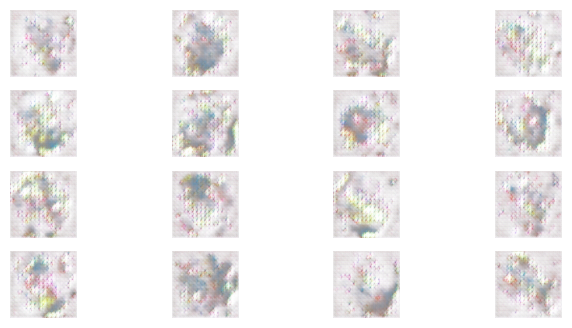

 28%|██▊       | 141/500 [20:23<51:35,  8.62s/it]

Time for epoch 141 is 7.514712572097778 sec
Training started with  epoch 142 with 7 batches..


 28%|██▊       | 142/500 [20:33<54:22,  9.11s/it]

Losses after epoch   142: generator 18.706, discriminator 1.555,               real_score 37.88%, fake_score 0.00%
Time for epoch 142 is 10.24983024597168 sec
Training started with  epoch 143 with 7 batches..


 29%|██▊       | 143/500 [20:40<50:03,  8.41s/it]

Losses after epoch   143: generator 2.673, discriminator 0.327,               real_score 99.88%, fake_score 19.88%
Time for epoch 143 is 6.779828071594238 sec
Training started with  epoch 144 with 7 batches..


 29%|██▉       | 144/500 [20:50<53:10,  8.96s/it]

Losses after epoch   144: generator 1.298, discriminator 0.761,               real_score 99.98%, fake_score 41.39%
Time for epoch 144 is 10.240774393081665 sec
Training started with  epoch 145 with 7 batches..


 29%|██▉       | 145/500 [20:57<49:00,  8.28s/it]

Losses after epoch   145: generator 4.357, discriminator 0.074,               real_score 99.82%, fake_score 5.65%
Time for epoch 145 is 6.69561767578125 sec
Training started with  epoch 146 with 7 batches..


 29%|██▉       | 146/500 [21:07<52:20,  8.87s/it]

Losses after epoch   146: generator 3.930, discriminator 0.117,               real_score 98.16%, fake_score 7.65%
Time for epoch 146 is 10.246385097503662 sec
Training started with  epoch 147 with 7 batches..


 29%|██▉       | 147/500 [21:17<54:36,  9.28s/it]

Losses after epoch   147: generator 1.400, discriminator 0.682,               real_score 100.00%, fake_score 38.84%
Time for epoch 147 is 10.234389781951904 sec
Training started with  epoch 148 with 7 batches..


 30%|██▉       | 148/500 [21:28<56:07,  9.57s/it]

Losses after epoch   148: generator 5.257, discriminator 0.039,               real_score 98.17%, fake_score 1.93%
Time for epoch 148 is 10.234410762786865 sec
Training started with  epoch 149 with 7 batches..


 30%|██▉       | 149/500 [21:38<57:08,  9.77s/it]

Losses after epoch   149: generator 8.887, discriminator 0.019,               real_score 98.22%, fake_score 0.06%
Time for epoch 149 is 10.236803531646729 sec
Training started with  epoch 150 with 7 batches..


 30%|███       | 150/500 [21:45<51:36,  8.85s/it]

Losses after epoch   150: generator 7.406, discriminator 0.494,               real_score 74.72%, fake_score 0.34%
Time for epoch 150 is 6.69102144241333 sec
Training started with  epoch 151 with 7 batches..
Losses after epoch   151: generator 3.241, discriminator 0.178,               real_score 97.32%, fake_score 11.57%


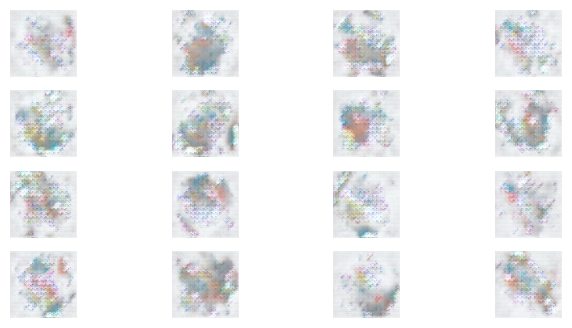

 30%|███       | 151/500 [21:52<48:44,  8.38s/it]

Time for epoch 151 is 7.2943243980407715 sec
Training started with  epoch 152 with 7 batches..


 30%|███       | 152/500 [22:02<51:51,  8.94s/it]

Losses after epoch   152: generator 1.052, discriminator 1.021,               real_score 100.00%, fake_score 49.44%
Time for epoch 152 is 10.241546630859375 sec
Training started with  epoch 153 with 7 batches..


 31%|███       | 153/500 [22:12<53:57,  9.33s/it]

Losses after epoch   153: generator 2.796, discriminator 0.250,               real_score 99.86%, fake_score 15.69%
Time for epoch 153 is 10.239381313323975 sec
Training started with  epoch 154 with 7 batches..


 31%|███       | 154/500 [22:19<49:22,  8.56s/it]

Losses after epoch   154: generator 1.154, discriminator 1.082,               real_score 100.00%, fake_score 49.78%
Time for epoch 154 is 6.76811671257019 sec
Training started with  epoch 155 with 7 batches..


 31%|███       | 155/500 [22:29<52:07,  9.06s/it]

Losses after epoch   155: generator 5.185, discriminator 0.071,               real_score 99.98%, fake_score 5.34%
Time for epoch 155 is 10.234369993209839 sec
Training started with  epoch 156 with 7 batches..


 31%|███       | 156/500 [22:36<48:34,  8.47s/it]

Losses after epoch   156: generator 10.928, discriminator 0.474,               real_score 73.51%, fake_score 0.01%
Time for epoch 156 is 7.088489294052124 sec
Training started with  epoch 157 with 7 batches..


 31%|███▏      | 157/500 [22:47<51:33,  9.02s/it]

Losses after epoch   157: generator 4.879, discriminator 0.069,               real_score 96.77%, fake_score 3.10%
Time for epoch 157 is 10.293153285980225 sec
Training started with  epoch 158 with 7 batches..


 32%|███▏      | 158/500 [22:55<49:23,  8.67s/it]

Losses after epoch   158: generator 4.419, discriminator 0.116,               real_score 95.51%, fake_score 4.69%
Time for epoch 158 is 7.8284173011779785 sec
Training started with  epoch 159 with 7 batches..


 32%|███▏      | 159/500 [23:05<51:58,  9.14s/it]

Losses after epoch   159: generator 3.856, discriminator 0.149,               real_score 95.13%, fake_score 7.71%
Time for epoch 159 is 10.255550146102905 sec
Training started with  epoch 160 with 7 batches..


 32%|███▏      | 160/500 [23:15<53:44,  9.48s/it]

Losses after epoch   160: generator 2.881, discriminator 0.225,               real_score 99.95%, fake_score 15.77%
Time for epoch 160 is 10.264300346374512 sec
Training started with  epoch 161 with 7 batches..
Losses after epoch   161: generator 4.253, discriminator 0.089,               real_score 98.94%, fake_score 5.99%


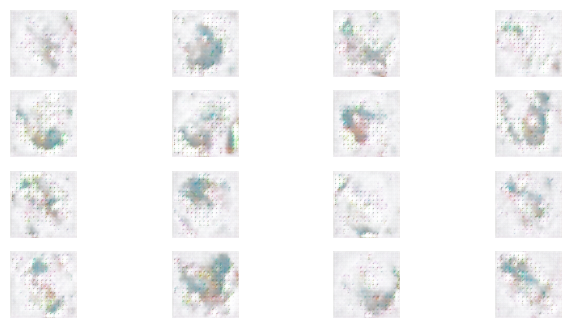

 32%|███▏      | 161/500 [23:26<56:15,  9.96s/it]

Time for epoch 161 is 11.064798593521118 sec
Training started with  epoch 162 with 7 batches..


 32%|███▏      | 162/500 [23:36<56:34, 10.04s/it]

Losses after epoch   162: generator 2.425, discriminator 0.268,               real_score 99.21%, fake_score 18.60%
Time for epoch 162 is 10.237719535827637 sec
Training started with  epoch 163 with 7 batches..


 33%|███▎      | 163/500 [23:43<50:43,  9.03s/it]

Losses after epoch   163: generator 3.856, discriminator 0.166,               real_score 97.11%, fake_score 9.16%
Time for epoch 163 is 6.666830778121948 sec
Training started with  epoch 164 with 7 batches..


 33%|███▎      | 164/500 [23:50<46:46,  8.35s/it]

Losses after epoch   164: generator 0.742, discriminator 1.427,               real_score 99.98%, fake_score 59.62%
Time for epoch 164 is 6.770207405090332 sec
Training started with  epoch 165 with 7 batches..


 33%|███▎      | 165/500 [23:57<43:53,  7.86s/it]

Losses after epoch   165: generator 20.701, discriminator 0.629,               real_score 66.71%, fake_score 0.00%
Time for epoch 165 is 6.713993072509766 sec
Training started with  epoch 166 with 7 batches..


 33%|███▎      | 166/500 [24:07<47:44,  8.58s/it]

Losses after epoch   166: generator 1.780, discriminator 0.525,               real_score 100.00%, fake_score 30.53%
Time for epoch 166 is 10.238191843032837 sec
Training started with  epoch 167 with 7 batches..


 33%|███▎      | 167/500 [24:14<44:39,  8.05s/it]

Losses after epoch   167: generator 3.565, discriminator 0.183,               real_score 95.56%, fake_score 10.11%
Time for epoch 167 is 6.81010365486145 sec
Training started with  epoch 168 with 7 batches..


 34%|███▎      | 168/500 [24:24<48:10,  8.71s/it]

Losses after epoch   168: generator 4.188, discriminator 0.095,               real_score 97.26%, fake_score 5.66%
Time for epoch 168 is 10.240567684173584 sec
Training started with  epoch 169 with 7 batches..


 34%|███▍      | 169/500 [24:34<50:34,  9.17s/it]

Losses after epoch   169: generator 0.719, discriminator 1.598,               real_score 100.00%, fake_score 62.20%
Time for epoch 169 is 10.242334604263306 sec
Training started with  epoch 170 with 7 batches..


 34%|███▍      | 170/500 [24:41<46:33,  8.46s/it]

Losses after epoch   170: generator 6.620, discriminator 0.166,               real_score 90.66%, fake_score 0.55%
Time for epoch 170 is 6.8249335289001465 sec
Training started with  epoch 171 with 7 batches..
Losses after epoch   171: generator 0.174, discriminator 3.293,               real_score 100.00%, fake_score 87.67%


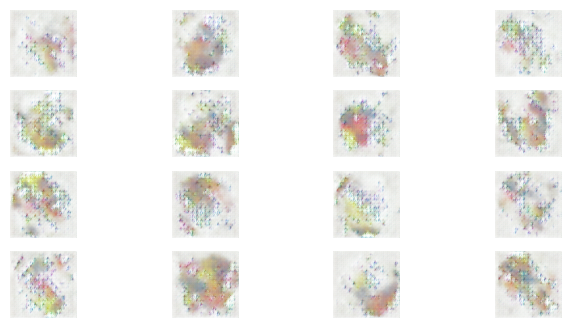

 34%|███▍      | 171/500 [24:52<50:13,  9.16s/it]

Time for epoch 171 is 10.778939008712769 sec
Training started with  epoch 172 with 7 batches..


 34%|███▍      | 172/500 [25:02<51:51,  9.49s/it]

Losses after epoch   172: generator 3.267, discriminator 0.369,               real_score 91.66%, fake_score 14.77%
Time for epoch 172 is 10.245245695114136 sec
Training started with  epoch 173 with 7 batches..


 35%|███▍      | 173/500 [25:12<52:55,  9.71s/it]

Losses after epoch   173: generator 2.646, discriminator 0.256,               real_score 100.00%, fake_score 17.61%
Time for epoch 173 is 10.235260963439941 sec
Training started with  epoch 174 with 7 batches..


 35%|███▍      | 174/500 [25:22<53:39,  9.88s/it]

Losses after epoch   174: generator 5.942, discriminator 0.550,               real_score 70.01%, fake_score 2.12%
Time for epoch 174 is 10.260373830795288 sec
Training started with  epoch 175 with 7 batches..


 35%|███▌      | 175/500 [25:33<54:05,  9.99s/it]

Losses after epoch   175: generator 19.304, discriminator 1.624,               real_score 44.42%, fake_score 0.00%
Time for epoch 175 is 10.238949060440063 sec
Training started with  epoch 176 with 7 batches..


 35%|███▌      | 176/500 [25:39<48:40,  9.01s/it]

Losses after epoch   176: generator 10.166, discriminator 0.533,               real_score 69.98%, fake_score 0.07%
Time for epoch 176 is 6.743557691574097 sec
Training started with  epoch 177 with 7 batches..


 35%|███▌      | 177/500 [25:50<50:29,  9.38s/it]

Losses after epoch   177: generator 2.006, discriminator 0.517,               real_score 100.00%, fake_score 28.02%
Time for epoch 177 is 10.234212875366211 sec
Training started with  epoch 178 with 7 batches..


 36%|███▌      | 178/500 [26:00<51:44,  9.64s/it]

Losses after epoch   178: generator 5.801, discriminator 0.069,               real_score 95.93%, fake_score 2.13%
Time for epoch 178 is 10.243180513381958 sec
Training started with  epoch 179 with 7 batches..


 36%|███▌      | 179/500 [26:07<46:59,  8.78s/it]

Losses after epoch   179: generator 7.240, discriminator 0.043,               real_score 96.55%, fake_score 0.49%
Time for epoch 179 is 6.780417203903198 sec
Training started with  epoch 180 with 7 batches..


 36%|███▌      | 180/500 [26:13<43:29,  8.16s/it]

Losses after epoch   180: generator 12.940, discriminator 0.148,               real_score 91.66%, fake_score 0.00%
Time for epoch 180 is 6.69308614730835 sec
Training started with  epoch 181 with 7 batches..
Losses after epoch   181: generator 6.099, discriminator 0.128,               real_score 91.39%, fake_score 1.37%


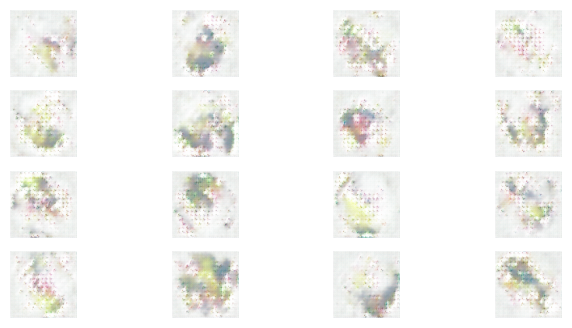

 36%|███▌      | 181/500 [26:21<41:56,  7.89s/it]

Time for epoch 181 is 7.259349346160889 sec
Training started with  epoch 182 with 7 batches..


 36%|███▋      | 182/500 [26:31<45:32,  8.59s/it]

Losses after epoch   182: generator 3.029, discriminator 0.185,               real_score 99.27%, fake_score 13.58%
Time for epoch 182 is 10.239486455917358 sec
Training started with  epoch 183 with 7 batches..


 37%|███▋      | 183/500 [26:41<48:00,  9.09s/it]

Losses after epoch   183: generator 2.822, discriminator 0.221,               real_score 98.86%, fake_score 14.98%
Time for epoch 183 is 10.23640489578247 sec
Training started with  epoch 184 with 7 batches..


 37%|███▋      | 184/500 [26:51<49:40,  9.43s/it]

Losses after epoch   184: generator 0.877, discriminator 1.203,               real_score 99.96%, fake_score 55.27%
Time for epoch 184 is 10.239550352096558 sec
Training started with  epoch 185 with 7 batches..


 37%|███▋      | 185/500 [26:58<45:24,  8.65s/it]

Losses after epoch   185: generator 10.135, discriminator 0.321,               real_score 79.74%, fake_score 0.02%
Time for epoch 185 is 6.82006049156189 sec
Training started with  epoch 186 with 7 batches..


 37%|███▋      | 186/500 [27:08<47:45,  9.13s/it]

Losses after epoch   186: generator 0.272, discriminator 2.597,               real_score 99.99%, fake_score 82.26%
Time for epoch 186 is 10.236531496047974 sec
Training started with  epoch 187 with 7 batches..


 37%|███▋      | 187/500 [27:15<43:48,  8.40s/it]

Losses after epoch   187: generator 8.826, discriminator 2.261,               real_score 23.13%, fake_score 0.10%
Time for epoch 187 is 6.697206258773804 sec
Training started with  epoch 188 with 7 batches..


 38%|███▊      | 188/500 [27:25<46:32,  8.95s/it]

Losses after epoch   188: generator 5.421, discriminator 0.121,               real_score 95.95%, fake_score 4.16%
Time for epoch 188 is 10.23539686203003 sec
Training started with  epoch 189 with 7 batches..


 38%|███▊      | 189/500 [27:36<48:23,  9.34s/it]

Losses after epoch   189: generator 2.119, discriminator 0.399,               real_score 99.92%, fake_score 25.54%
Time for epoch 189 is 10.234959840774536 sec
Training started with  epoch 190 with 7 batches..


 38%|███▊      | 190/500 [27:42<44:11,  8.55s/it]

Losses after epoch   190: generator 15.792, discriminator 4.764,               real_score 4.50%, fake_score 0.00%
Time for epoch 190 is 6.71947717666626 sec
Training started with  epoch 191 with 7 batches..
Losses after epoch   191: generator 4.749, discriminator 0.052,               real_score 98.91%, fake_score 3.63%


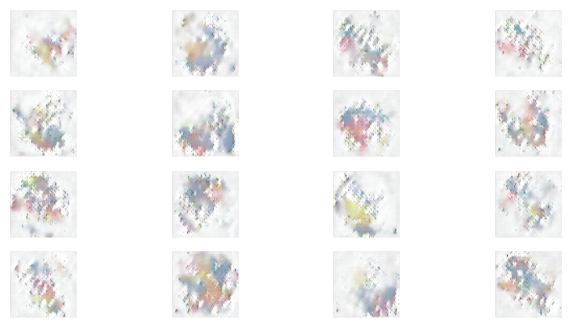

 38%|███▊      | 191/500 [27:50<42:09,  8.19s/it]

Time for epoch 191 is 7.327862024307251 sec
Training started with  epoch 192 with 7 batches..


 38%|███▊      | 192/500 [27:56<39:50,  7.76s/it]

Losses after epoch   192: generator 5.227, discriminator 0.025,               real_score 99.71%, fake_score 2.07%
Time for epoch 192 is 6.770425796508789 sec
Training started with  epoch 193 with 7 batches..


 39%|███▊      | 193/500 [28:07<43:31,  8.51s/it]

Losses after epoch   193: generator 0.376, discriminator 2.317,               real_score 99.99%, fake_score 76.94%
Time for epoch 193 is 10.237751960754395 sec
Training started with  epoch 194 with 7 batches..


 39%|███▉      | 194/500 [28:17<46:01,  9.02s/it]

Losses after epoch   194: generator 7.827, discriminator 0.176,               real_score 87.32%, fake_score 0.56%
Time for epoch 194 is 10.23448920249939 sec
Training started with  epoch 195 with 7 batches..


 39%|███▉      | 195/500 [28:24<42:23,  8.34s/it]

Losses after epoch   195: generator 17.062, discriminator 2.289,               real_score 28.27%, fake_score 0.00%
Time for epoch 195 is 6.734180212020874 sec
Training started with  epoch 196 with 7 batches..


 39%|███▉      | 196/500 [28:34<45:08,  8.91s/it]

Losses after epoch   196: generator 5.102, discriminator 0.054,               real_score 98.64%, fake_score 3.33%
Time for epoch 196 is 10.23878002166748 sec
Training started with  epoch 197 with 7 batches..


 39%|███▉      | 197/500 [28:41<41:46,  8.27s/it]

Losses after epoch   197: generator 3.822, discriminator 0.148,               real_score 96.64%, fake_score 8.54%
Time for epoch 197 is 6.786513090133667 sec
Training started with  epoch 198 with 7 batches..


 40%|███▉      | 198/500 [28:47<39:14,  7.80s/it]

Losses after epoch   198: generator 4.844, discriminator 0.100,               real_score 97.23%, fake_score 5.15%
Time for epoch 198 is 6.6853578090667725 sec
Training started with  epoch 199 with 7 batches..


 40%|███▉      | 199/500 [28:54<37:48,  7.54s/it]

Losses after epoch   199: generator 5.917, discriminator 0.154,               real_score 90.74%, fake_score 1.38%
Time for epoch 199 is 6.92719292640686 sec
Training started with  epoch 200 with 7 batches..


 40%|████      | 200/500 [29:05<41:44,  8.35s/it]

Losses after epoch   200: generator 17.323, discriminator 4.263,               real_score 4.02%, fake_score 0.00%
Time for epoch 200 is 10.240549564361572 sec
Training started with  epoch 201 with 7 batches..
Losses after epoch   201: generator 2.898, discriminator 0.235,               real_score 99.94%, fake_score 15.96%


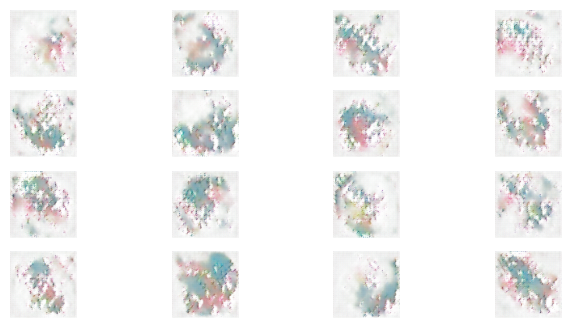

 40%|████      | 201/500 [29:12<40:00,  8.03s/it]

Time for epoch 201 is 7.279086589813232 sec
Training started with  epoch 202 with 7 batches..


 40%|████      | 202/500 [29:19<38:03,  7.66s/it]

Losses after epoch   202: generator 2.404, discriminator 0.444,               real_score 100.00%, fake_score 23.86%
Time for epoch 202 is 6.801119327545166 sec
Training started with  epoch 203 with 7 batches..


 41%|████      | 203/500 [29:25<36:28,  7.37s/it]

Losses after epoch   203: generator 4.391, discriminator 0.106,               real_score 96.59%, fake_score 5.81%
Time for epoch 203 is 6.680509328842163 sec
Training started with  epoch 204 with 7 batches..


 41%|████      | 204/500 [29:32<35:29,  7.19s/it]

Losses after epoch   204: generator 7.061, discriminator 0.009,               real_score 99.78%, fake_score 0.67%
Time for epoch 204 is 6.7902960777282715 sec
Training started with  epoch 205 with 7 batches..


 41%|████      | 205/500 [29:39<34:41,  7.06s/it]

Losses after epoch   205: generator 4.128, discriminator 0.204,               real_score 91.99%, fake_score 7.05%
Time for epoch 205 is 6.730925798416138 sec
Training started with  epoch 206 with 7 batches..


 41%|████      | 206/500 [29:49<39:15,  8.01s/it]

Losses after epoch   206: generator 2.235, discriminator 0.363,               real_score 99.92%, fake_score 23.65%
Time for epoch 206 is 10.23994517326355 sec
Training started with  epoch 207 with 7 batches..


 41%|████▏     | 207/500 [29:56<37:21,  7.65s/it]

Losses after epoch   207: generator 5.696, discriminator 0.119,               real_score 93.53%, fake_score 2.50%
Time for epoch 207 is 6.807567119598389 sec
Training started with  epoch 208 with 7 batches..


 42%|████▏     | 208/500 [30:06<41:00,  8.43s/it]

Losses after epoch   208: generator 4.919, discriminator 0.118,               real_score 92.71%, fake_score 2.73%
Time for epoch 208 is 10.23434042930603 sec
Training started with  epoch 209 with 7 batches..


 42%|████▏     | 209/500 [30:16<43:30,  8.97s/it]

Losses after epoch   209: generator 4.301, discriminator 0.141,               real_score 93.78%, fake_score 5.34%
Time for epoch 209 is 10.23429536819458 sec
Training started with  epoch 210 with 7 batches..


 42%|████▏     | 210/500 [30:23<40:10,  8.31s/it]

Losses after epoch   210: generator 0.428, discriminator 1.951,               real_score 99.97%, fake_score 74.00%
Time for epoch 210 is 6.779940843582153 sec
Training started with  epoch 211 with 7 batches..
Losses after epoch   211: generator 6.635, discriminator 0.082,               real_score 95.35%, fake_score 2.13%


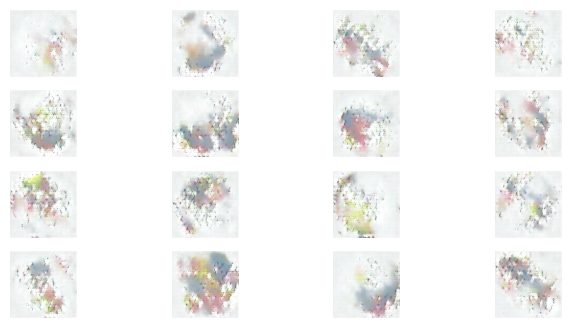

 42%|████▏     | 211/500 [30:31<39:21,  8.17s/it]

Time for epoch 211 is 7.835277795791626 sec
Training started with  epoch 212 with 7 batches..


 42%|████▏     | 212/500 [30:41<42:12,  8.79s/it]

Losses after epoch   212: generator 9.560, discriminator 0.316,               real_score 79.46%, fake_score 0.05%
Time for epoch 212 is 10.24811053276062 sec
Training started with  epoch 213 with 7 batches..


 43%|████▎     | 213/500 [30:48<39:14,  8.20s/it]

Losses after epoch   213: generator 4.483, discriminator 0.110,               real_score 100.00%, fake_score 8.00%
Time for epoch 213 is 6.822781801223755 sec
Training started with  epoch 214 with 7 batches..


 43%|████▎     | 214/500 [30:58<42:00,  8.81s/it]

Losses after epoch   214: generator 3.198, discriminator 0.214,               real_score 97.27%, fake_score 11.98%
Time for epoch 214 is 10.237746953964233 sec
Training started with  epoch 215 with 7 batches..


 43%|████▎     | 215/500 [31:09<43:54,  9.24s/it]

Losses after epoch   215: generator 0.068, discriminator 4.887,               real_score 100.00%, fake_score 95.37%
Time for epoch 215 is 10.238796472549438 sec
Training started with  epoch 216 with 7 batches..


 43%|████▎     | 216/500 [31:19<45:09,  9.54s/it]

Losses after epoch   216: generator 12.235, discriminator 0.281,               real_score 82.10%, fake_score 0.00%
Time for epoch 216 is 10.239754676818848 sec
Training started with  epoch 217 with 7 batches..


 43%|████▎     | 217/500 [31:26<41:02,  8.70s/it]

Losses after epoch   217: generator 4.446, discriminator 0.092,               real_score 99.17%, fake_score 5.75%
Time for epoch 217 is 6.733789443969727 sec
Training started with  epoch 218 with 7 batches..


 44%|████▎     | 218/500 [31:36<43:03,  9.16s/it]

Losses after epoch   218: generator 5.607, discriminator 0.103,               real_score 93.23%, fake_score 2.34%
Time for epoch 218 is 10.235151767730713 sec
Training started with  epoch 219 with 7 batches..


 44%|████▍     | 219/500 [31:46<44:25,  9.48s/it]

Losses after epoch   219: generator 4.498, discriminator 0.093,               real_score 97.31%, fake_score 5.50%
Time for epoch 219 is 10.238778591156006 sec
Training started with  epoch 220 with 7 batches..


 44%|████▍     | 220/500 [31:56<45:19,  9.71s/it]

Losses after epoch   220: generator 4.597, discriminator 0.165,               real_score 90.58%, fake_score 3.85%
Time for epoch 220 is 10.243499994277954 sec
Training started with  epoch 221 with 7 batches..
Losses after epoch   221: generator 4.271, discriminator 0.107,               real_score 96.22%, fake_score 5.55%


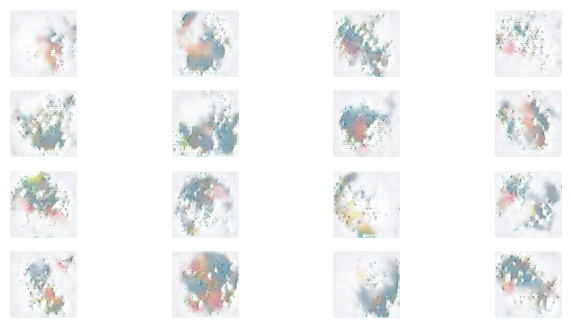

 44%|████▍     | 221/500 [32:07<46:39, 10.04s/it]

Time for epoch 221 is 10.786348342895508 sec
Training started with  epoch 222 with 7 batches..


 44%|████▍     | 222/500 [32:14<42:01,  9.07s/it]

Losses after epoch   222: generator 4.747, discriminator 0.121,               real_score 94.40%, fake_score 3.98%
Time for epoch 222 is 6.810675859451294 sec
Training started with  epoch 223 with 7 batches..


 45%|████▍     | 223/500 [32:21<38:33,  8.35s/it]

Losses after epoch   223: generator 3.479, discriminator 0.145,               real_score 96.41%, fake_score 8.88%
Time for epoch 223 is 6.676759958267212 sec
Training started with  epoch 224 with 7 batches..


 45%|████▍     | 224/500 [32:31<41:01,  8.92s/it]

Losses after epoch   224: generator 3.760, discriminator 0.164,               real_score 96.47%, fake_score 9.92%
Time for epoch 224 is 10.237610340118408 sec
Training started with  epoch 225 with 7 batches..


 45%|████▌     | 225/500 [32:38<37:54,  8.27s/it]

Losses after epoch   225: generator 4.385, discriminator 0.099,               real_score 96.04%, fake_score 4.72%
Time for epoch 225 is 6.763014316558838 sec
Training started with  epoch 226 with 7 batches..


 45%|████▌     | 226/500 [32:44<35:44,  7.83s/it]

Losses after epoch   226: generator 4.862, discriminator 0.145,               real_score 91.07%, fake_score 3.57%
Time for epoch 226 is 6.781157732009888 sec
Training started with  epoch 227 with 7 batches..


 45%|████▌     | 227/500 [32:51<34:05,  7.49s/it]

Losses after epoch   227: generator 2.912, discriminator 0.231,               real_score 98.27%, fake_score 14.76%
Time for epoch 227 is 6.715019702911377 sec
Training started with  epoch 228 with 7 batches..


 46%|████▌     | 228/500 [33:01<37:42,  8.32s/it]

Losses after epoch   228: generator 4.351, discriminator 0.121,               real_score 97.22%, fake_score 5.81%
Time for epoch 228 is 10.23525881767273 sec
Training started with  epoch 229 with 7 batches..


 46%|████▌     | 229/500 [33:08<35:35,  7.88s/it]

Losses after epoch   229: generator 3.180, discriminator 0.186,               real_score 99.85%, fake_score 13.63%
Time for epoch 229 is 6.859131097793579 sec
Training started with  epoch 230 with 7 batches..


 46%|████▌     | 230/500 [33:15<33:51,  7.52s/it]

Losses after epoch   230: generator 5.389, discriminator 0.045,               real_score 99.78%, fake_score 3.05%
Time for epoch 230 is 6.690171003341675 sec
Training started with  epoch 231 with 7 batches..
Losses after epoch   231: generator 7.755, discriminator 0.348,               real_score 78.56%, fake_score 0.21%


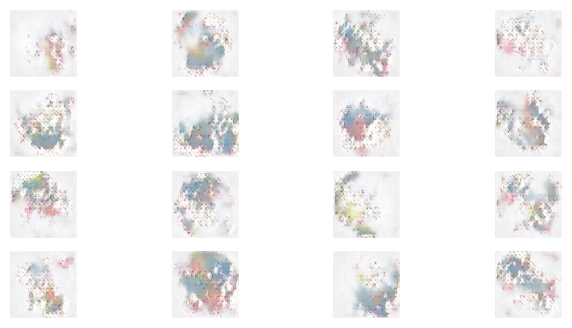

 46%|████▌     | 231/500 [33:26<38:08,  8.51s/it]

Time for epoch 231 is 10.798189878463745 sec
Training started with  epoch 232 with 7 batches..


 46%|████▋     | 232/500 [33:36<40:19,  9.03s/it]

Losses after epoch   232: generator 4.855, discriminator 0.100,               real_score 94.36%, fake_score 3.16%
Time for epoch 232 is 10.239166021347046 sec
Training started with  epoch 233 with 7 batches..


 47%|████▋     | 233/500 [33:43<37:11,  8.36s/it]

Losses after epoch   233: generator 5.236, discriminator 0.061,               real_score 97.48%, fake_score 3.17%
Time for epoch 233 is 6.789226770401001 sec
Training started with  epoch 234 with 7 batches..


 47%|████▋     | 234/500 [33:49<34:56,  7.88s/it]

Losses after epoch   234: generator 4.788, discriminator 0.066,               real_score 99.99%, fake_score 5.17%
Time for epoch 234 is 6.766122102737427 sec
Training started with  epoch 235 with 7 batches..


 47%|████▋     | 235/500 [34:00<37:55,  8.59s/it]

Losses after epoch   235: generator 0.372, discriminator 2.421,               real_score 100.00%, fake_score 77.62%
Time for epoch 235 is 10.239764213562012 sec
Training started with  epoch 236 with 7 batches..


 47%|████▋     | 236/500 [34:06<35:23,  8.04s/it]

Losses after epoch   236: generator 13.091, discriminator 0.210,               real_score 86.98%, fake_score 0.00%
Time for epoch 236 is 6.768664598464966 sec
Training started with  epoch 237 with 7 batches..


 47%|████▋     | 237/500 [34:17<38:09,  8.71s/it]

Losses after epoch   237: generator 6.357, discriminator 0.088,               real_score 95.67%, fake_score 2.51%
Time for epoch 237 is 10.248758792877197 sec
Training started with  epoch 238 with 7 batches..


 48%|████▊     | 238/500 [34:23<35:31,  8.13s/it]

Losses after epoch   238: generator 6.034, discriminator 0.111,               real_score 93.34%, fake_score 1.01%
Time for epoch 238 is 6.798062801361084 sec
Training started with  epoch 239 with 7 batches..


 48%|████▊     | 239/500 [34:30<33:27,  7.69s/it]

Losses after epoch   239: generator 5.566, discriminator 0.073,               real_score 97.17%, fake_score 3.45%
Time for epoch 239 is 6.656805753707886 sec
Training started with  epoch 240 with 7 batches..


 48%|████▊     | 240/500 [34:40<36:38,  8.45s/it]

Losses after epoch   240: generator 3.505, discriminator 0.168,               real_score 98.82%, fake_score 11.90%
Time for epoch 240 is 10.235074281692505 sec
Training started with  epoch 241 with 7 batches..
Losses after epoch   241: generator 3.929, discriminator 0.138,               real_score 96.88%, fake_score 7.54%


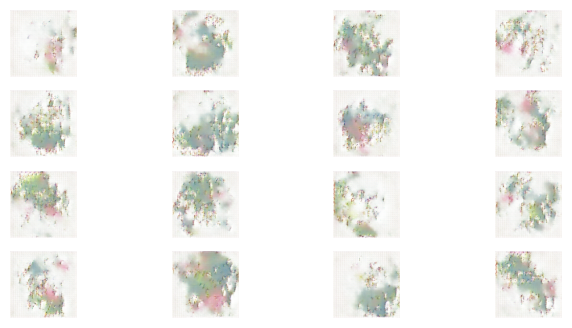

 48%|████▊     | 241/500 [34:48<35:03,  8.12s/it]

Time for epoch 241 is 7.345699310302734 sec
Training started with  epoch 242 with 7 batches..


 48%|████▊     | 242/500 [34:58<37:39,  8.76s/it]

Losses after epoch   242: generator 4.541, discriminator 0.075,               real_score 97.82%, fake_score 4.31%
Time for epoch 242 is 10.23686695098877 sec
Training started with  epoch 243 with 7 batches..


 49%|████▊     | 243/500 [35:08<39:25,  9.20s/it]

Losses after epoch   243: generator 4.134, discriminator 0.126,               real_score 95.00%, fake_score 5.72%
Time for epoch 243 is 10.239837169647217 sec
Training started with  epoch 244 with 7 batches..


 49%|████▉     | 244/500 [35:18<40:35,  9.51s/it]

Losses after epoch   244: generator 4.510, discriminator 0.070,               real_score 99.97%, fake_score 5.67%
Time for epoch 244 is 10.234330892562866 sec
Training started with  epoch 245 with 7 batches..


 49%|████▉     | 245/500 [35:29<41:21,  9.73s/it]

Losses after epoch   245: generator 6.224, discriminator 0.060,               real_score 96.10%, fake_score 1.52%
Time for epoch 245 is 10.235344648361206 sec
Training started with  epoch 246 with 7 batches..


 49%|████▉     | 246/500 [35:39<41:50,  9.88s/it]

Losses after epoch   246: generator 24.194, discriminator 5.580,               real_score 2.45%, fake_score 0.00%
Time for epoch 246 is 10.236253499984741 sec
Training started with  epoch 247 with 7 batches..


 49%|████▉     | 247/500 [35:49<42:07,  9.99s/it]

Losses after epoch   247: generator 15.421, discriminator 0.124,               real_score 90.05%, fake_score 0.00%
Time for epoch 247 is 10.234915971755981 sec
Training started with  epoch 248 with 7 batches..


 50%|████▉     | 248/500 [35:59<42:16, 10.06s/it]

Losses after epoch   248: generator 0.292, discriminator 3.040,               real_score 100.00%, fake_score 82.71%
Time for epoch 248 is 10.235860824584961 sec
Training started with  epoch 249 with 7 batches..


 50%|████▉     | 249/500 [36:10<42:19, 10.12s/it]

Losses after epoch   249: generator 1.425, discriminator 0.989,               real_score 100.00%, fake_score 45.81%
Time for epoch 249 is 10.243421792984009 sec
Training started with  epoch 250 with 7 batches..


 50%|█████     | 250/500 [36:16<37:56,  9.11s/it]

Losses after epoch   250: generator 0.386, discriminator 2.820,               real_score 100.00%, fake_score 77.28%
Time for epoch 250 is 6.748036861419678 sec
Training started with  epoch 251 with 7 batches..
Losses after epoch   251: generator 6.016, discriminator 0.182,               real_score 90.13%, fake_score 1.82%


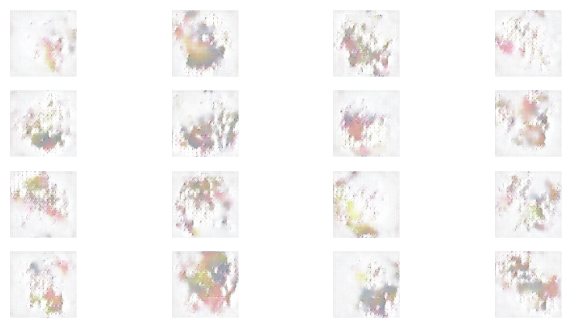

 50%|█████     | 251/500 [36:27<40:14,  9.70s/it]

Time for epoch 251 is 11.07256269454956 sec
Training started with  epoch 252 with 7 batches..


 50%|█████     | 252/500 [36:38<40:45,  9.86s/it]

Losses after epoch   252: generator 4.768, discriminator 0.196,               real_score 94.43%, fake_score 7.60%
Time for epoch 252 is 10.242854595184326 sec
Training started with  epoch 253 with 7 batches..


 51%|█████     | 253/500 [36:44<36:47,  8.94s/it]

Losses after epoch   253: generator 4.995, discriminator 0.066,               real_score 97.72%, fake_score 3.61%
Time for epoch 253 is 6.778080940246582 sec
Training started with  epoch 254 with 7 batches..


 51%|█████     | 254/500 [36:51<33:51,  8.26s/it]

Losses after epoch   254: generator 2.999, discriminator 0.182,               real_score 99.26%, fake_score 13.89%
Time for epoch 254 is 6.677599668502808 sec
Training started with  epoch 255 with 7 batches..


 51%|█████     | 255/500 [36:58<31:49,  7.79s/it]

Losses after epoch   255: generator 5.690, discriminator 0.084,               real_score 94.99%, fake_score 1.69%
Time for epoch 255 is 6.701218605041504 sec
Training started with  epoch 256 with 7 batches..


 51%|█████     | 256/500 [37:05<30:27,  7.49s/it]

Losses after epoch   256: generator 5.266, discriminator 0.086,               real_score 95.49%, fake_score 3.23%
Time for epoch 256 is 6.778094291687012 sec
Training started with  epoch 257 with 7 batches..


 51%|█████▏    | 257/500 [37:11<29:18,  7.24s/it]

Losses after epoch   257: generator 3.988, discriminator 0.117,               real_score 99.32%, fake_score 8.22%
Time for epoch 257 is 6.6524341106414795 sec
Training started with  epoch 258 with 7 batches..


 52%|█████▏    | 258/500 [37:18<28:38,  7.10s/it]

Losses after epoch   258: generator 4.218, discriminator 0.088,               real_score 98.25%, fake_score 5.74%
Time for epoch 258 is 6.784379243850708 sec
Training started with  epoch 259 with 7 batches..


 52%|█████▏    | 259/500 [37:28<32:18,  8.04s/it]

Losses after epoch   259: generator 2.226, discriminator 0.371,               real_score 99.91%, fake_score 22.77%
Time for epoch 259 is 10.238478422164917 sec
Training started with  epoch 260 with 7 batches..


 52%|█████▏    | 260/500 [37:35<30:43,  7.68s/it]

Losses after epoch   260: generator 4.359, discriminator 0.132,               real_score 94.37%, fake_score 5.25%
Time for epoch 260 is 6.831844806671143 sec
Training started with  epoch 261 with 7 batches..
Losses after epoch   261: generator 7.824, discriminator 0.006,               real_score 99.68%, fake_score 0.25%


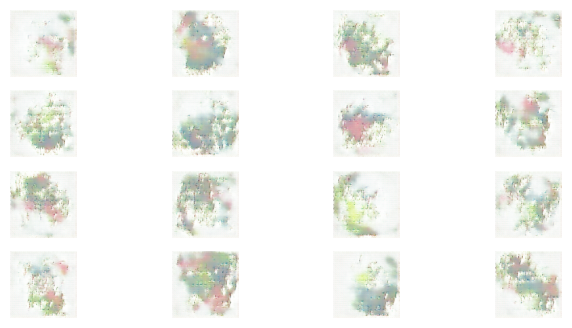

 52%|█████▏    | 261/500 [37:46<34:19,  8.62s/it]

Time for epoch 261 is 10.793570041656494 sec
Training started with  epoch 262 with 7 batches..


 52%|█████▏    | 262/500 [37:53<32:01,  8.07s/it]

Losses after epoch   262: generator 4.869, discriminator 0.103,               real_score 96.36%, fake_score 4.77%
Time for epoch 262 is 6.806656837463379 sec
Training started with  epoch 263 with 7 batches..


 53%|█████▎    | 263/500 [38:00<30:22,  7.69s/it]

Losses after epoch   263: generator 5.952, discriminator 0.076,               real_score 94.53%, fake_score 1.32%
Time for epoch 263 is 6.7971155643463135 sec
Training started with  epoch 264 with 7 batches..


 53%|█████▎    | 264/500 [38:06<29:05,  7.40s/it]

Losses after epoch   264: generator 5.480, discriminator 0.140,               real_score 90.62%, fake_score 1.82%
Time for epoch 264 is 6.705405950546265 sec
Training started with  epoch 265 with 7 batches..


 53%|█████▎    | 265/500 [38:13<28:13,  7.21s/it]

Losses after epoch   265: generator 5.230, discriminator 0.056,               real_score 97.66%, fake_score 2.68%
Time for epoch 265 is 6.766840934753418 sec
Training started with  epoch 266 with 7 batches..


 53%|█████▎    | 266/500 [38:20<27:33,  7.06s/it]

Losses after epoch   266: generator 4.550, discriminator 0.077,               real_score 97.36%, fake_score 4.30%
Time for epoch 266 is 6.7294042110443115 sec
Training started with  epoch 267 with 7 batches..


 53%|█████▎    | 267/500 [38:27<27:08,  6.99s/it]

Losses after epoch   267: generator 4.674, discriminator 0.116,               real_score 93.12%, fake_score 3.38%
Time for epoch 267 is 6.809229612350464 sec
Training started with  epoch 268 with 7 batches..


 54%|█████▎    | 268/500 [38:37<30:47,  7.96s/it]

Losses after epoch   268: generator 5.250, discriminator 0.108,               real_score 92.48%, fake_score 2.27%
Time for epoch 268 is 10.235076427459717 sec
Training started with  epoch 269 with 7 batches..


 54%|█████▍    | 269/500 [38:47<33:17,  8.65s/it]

Losses after epoch   269: generator 5.029, discriminator 0.098,               real_score 94.14%, fake_score 2.98%
Time for epoch 269 is 10.234335899353027 sec
Training started with  epoch 270 with 7 batches..


 54%|█████▍    | 270/500 [38:54<30:54,  8.06s/it]

Losses after epoch   270: generator 5.088, discriminator 0.065,               real_score 96.80%, fake_score 2.76%
Time for epoch 270 is 6.698851823806763 sec
Training started with  epoch 271 with 7 batches..
Losses after epoch   271: generator 4.227, discriminator 0.106,               real_score 98.73%, fake_score 6.36%


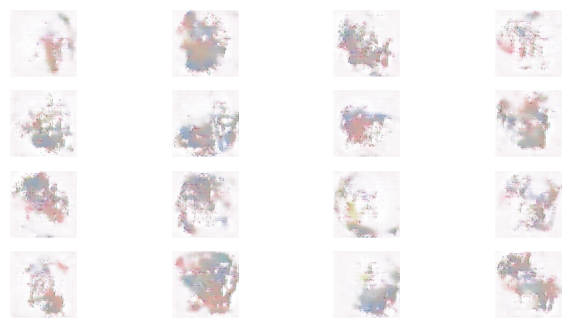

 54%|█████▍    | 271/500 [39:05<33:55,  8.89s/it]

Time for epoch 271 is 10.817139863967896 sec
Training started with  epoch 272 with 7 batches..


 54%|█████▍    | 272/500 [39:11<31:26,  8.27s/it]

Losses after epoch   272: generator 4.993, discriminator 0.126,               real_score 93.41%, fake_score 3.66%
Time for epoch 272 is 6.830628871917725 sec
Training started with  epoch 273 with 7 batches..


 55%|█████▍    | 273/500 [39:18<29:33,  7.81s/it]

Losses after epoch   273: generator 4.431, discriminator 0.108,               real_score 95.44%, fake_score 4.77%
Time for epoch 273 is 6.74603796005249 sec
Training started with  epoch 274 with 7 batches..


 55%|█████▍    | 274/500 [39:28<32:10,  8.54s/it]

Losses after epoch   274: generator 5.150, discriminator 0.135,               real_score 93.31%, fake_score 3.74%
Time for epoch 274 is 10.239537000656128 sec
Training started with  epoch 275 with 7 batches..


 55%|█████▌    | 275/500 [39:39<33:56,  9.05s/it]

Losses after epoch   275: generator 5.460, discriminator 0.070,               real_score 97.16%, fake_score 3.10%
Time for epoch 275 is 10.235397815704346 sec
Training started with  epoch 276 with 7 batches..


 55%|█████▌    | 276/500 [39:49<35:07,  9.41s/it]

Losses after epoch   276: generator 2.117, discriminator 0.640,               real_score 100.00%, fake_score 32.87%
Time for epoch 276 is 10.235441207885742 sec
Training started with  epoch 277 with 7 batches..


 55%|█████▌    | 277/500 [39:56<31:58,  8.60s/it]

Losses after epoch   277: generator 18.117, discriminator 3.477,               real_score 23.07%, fake_score 0.00%
Time for epoch 277 is 6.724725723266602 sec
Training started with  epoch 278 with 7 batches..


 56%|█████▌    | 278/500 [40:02<29:46,  8.05s/it]

Losses after epoch   278: generator 17.389, discriminator 0.541,               real_score 73.64%, fake_score 0.00%
Time for epoch 278 is 6.74409031867981 sec
Training started with  epoch 279 with 7 batches..


 56%|█████▌    | 279/500 [40:09<28:07,  7.64s/it]

Losses after epoch   279: generator 10.211, discriminator 0.114,               real_score 91.15%, fake_score 0.13%
Time for epoch 279 is 6.6835267543792725 sec
Training started with  epoch 280 with 7 batches..


 56%|█████▌    | 280/500 [40:16<27:05,  7.39s/it]

Losses after epoch   280: generator 20.357, discriminator 0.009,               real_score 99.16%, fake_score 0.00%
Time for epoch 280 is 6.809374570846558 sec
Training started with  epoch 281 with 7 batches..
Losses after epoch   281: generator 7.419, discriminator 0.101,               real_score 93.48%, fake_score 1.63%


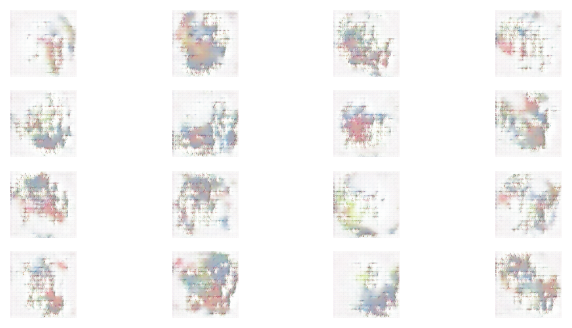

 56%|█████▌    | 281/500 [40:27<30:44,  8.42s/it]

Time for epoch 281 is 10.83106279373169 sec
Training started with  epoch 282 with 7 batches..


 56%|█████▋    | 282/500 [40:37<32:34,  8.97s/it]

Losses after epoch   282: generator 5.646, discriminator 0.048,               real_score 97.88%, fake_score 2.10%
Time for epoch 282 is 10.236706256866455 sec
Training started with  epoch 283 with 7 batches..


 57%|█████▋    | 283/500 [40:47<33:50,  9.35s/it]

Losses after epoch   283: generator 4.687, discriminator 0.086,               real_score 97.60%, fake_score 4.66%
Time for epoch 283 is 10.257073640823364 sec
Training started with  epoch 284 with 7 batches..


 57%|█████▋    | 284/500 [40:57<34:37,  9.62s/it]

Losses after epoch   284: generator 5.139, discriminator 0.066,               real_score 97.89%, fake_score 3.86%
Time for epoch 284 is 10.235432147979736 sec
Training started with  epoch 285 with 7 batches..


 57%|█████▋    | 285/500 [41:08<35:08,  9.81s/it]

Losses after epoch   285: generator 5.201, discriminator 0.074,               real_score 96.22%, fake_score 2.70%
Time for epoch 285 is 10.244592428207397 sec
Training started with  epoch 286 with 7 batches..


 57%|█████▋    | 286/500 [41:18<35:26,  9.94s/it]

Losses after epoch   286: generator 5.267, discriminator 0.069,               real_score 97.74%, fake_score 3.28%
Time for epoch 286 is 10.237766742706299 sec
Training started with  epoch 287 with 7 batches..


 57%|█████▋    | 287/500 [41:25<31:48,  8.96s/it]

Losses after epoch   287: generator 3.579, discriminator 0.158,               real_score 98.61%, fake_score 10.59%
Time for epoch 287 is 6.681717872619629 sec
Training started with  epoch 288 with 7 batches..


 58%|█████▊    | 288/500 [41:35<33:00,  9.34s/it]

Losses after epoch   288: generator 20.827, discriminator 6.054,               real_score 1.32%, fake_score 0.00%
Time for epoch 288 is 10.233994007110596 sec
Training started with  epoch 289 with 7 batches..


 58%|█████▊    | 289/500 [41:45<33:47,  9.61s/it]

Losses after epoch   289: generator 0.264, discriminator 2.819,               real_score 100.00%, fake_score 82.89%
Time for epoch 289 is 10.23408579826355 sec
Training started with  epoch 290 with 7 batches..


 58%|█████▊    | 290/500 [41:52<30:35,  8.74s/it]

Losses after epoch   290: generator 2.472, discriminator 0.632,               real_score 99.01%, fake_score 28.63%
Time for epoch 290 is 6.703749895095825 sec
Training started with  epoch 291 with 7 batches..
Losses after epoch   291: generator 6.741, discriminator 0.045,               real_score 100.00%, fake_score 3.90%


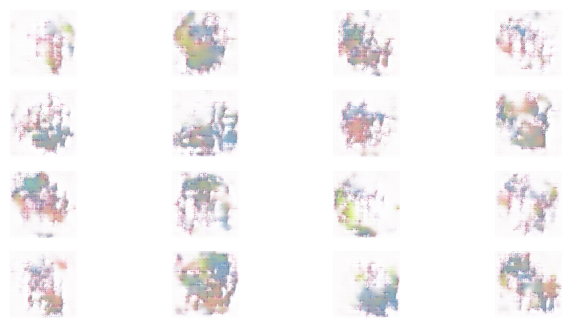

 58%|█████▊    | 291/500 [41:59<29:22,  8.43s/it]

Time for epoch 291 is 7.705709934234619 sec
Training started with  epoch 292 with 7 batches..


 58%|█████▊    | 292/500 [42:06<27:30,  7.93s/it]

Losses after epoch   292: generator 18.775, discriminator 0.390,               real_score 78.53%, fake_score 0.00%
Time for epoch 292 is 6.771599769592285 sec
Training started with  epoch 293 with 7 batches..


 59%|█████▊    | 293/500 [42:17<29:46,  8.63s/it]

Losses after epoch   293: generator 5.994, discriminator 0.133,               real_score 93.66%, fake_score 3.31%
Time for epoch 293 is 10.246020317077637 sec
Training started with  epoch 294 with 7 batches..


 59%|█████▉    | 294/500 [42:23<27:42,  8.07s/it]

Losses after epoch   294: generator 5.356, discriminator 0.080,               real_score 97.55%, fake_score 3.86%
Time for epoch 294 is 6.769625425338745 sec
Training started with  epoch 295 with 7 batches..


 59%|█████▉    | 295/500 [42:34<29:47,  8.72s/it]

Losses after epoch   295: generator 4.588, discriminator 0.126,               real_score 97.38%, fake_score 6.93%
Time for epoch 295 is 10.235963106155396 sec
Training started with  epoch 296 with 7 batches..


 59%|█████▉    | 296/500 [42:44<31:11,  9.18s/it]

Losses after epoch   296: generator 3.958, discriminator 0.149,               real_score 98.13%, fake_score 9.33%
Time for epoch 296 is 10.236519813537598 sec
Training started with  epoch 297 with 7 batches..


 59%|█████▉    | 297/500 [42:54<32:07,  9.50s/it]

Losses after epoch   297: generator 6.311, discriminator 0.105,               real_score 93.17%, fake_score 1.21%
Time for epoch 297 is 10.238668203353882 sec
Training started with  epoch 298 with 7 batches..


 60%|█████▉    | 298/500 [43:01<29:12,  8.67s/it]

Losses after epoch   298: generator 5.153, discriminator 0.061,               real_score 98.18%, fake_score 3.67%
Time for epoch 298 is 6.754776477813721 sec
Training started with  epoch 299 with 7 batches..


 60%|█████▉    | 299/500 [43:11<30:38,  9.15s/it]

Losses after epoch   299: generator 4.564, discriminator 0.092,               real_score 97.14%, fake_score 5.06%
Time for epoch 299 is 10.249302387237549 sec
Training started with  epoch 300 with 7 batches..


 60%|██████    | 300/500 [43:18<28:02,  8.41s/it]

Losses after epoch   300: generator 4.825, discriminator 0.036,               real_score 99.51%, fake_score 2.93%
Time for epoch 300 is 6.695019960403442 sec
Training started with  epoch 301 with 7 batches..
Losses after epoch   301: generator 4.820, discriminator 0.061,               real_score 98.31%, fake_score 3.84%


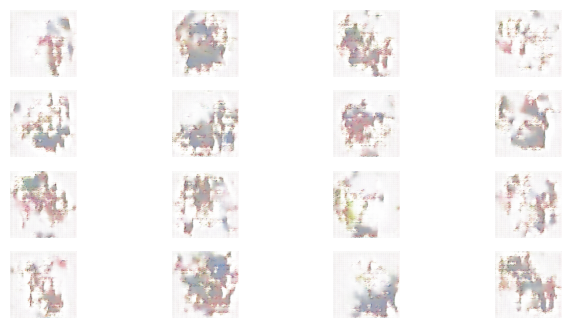

 60%|██████    | 301/500 [43:25<26:48,  8.08s/it]

Time for epoch 301 is 7.313565731048584 sec
Training started with  epoch 302 with 7 batches..


 60%|██████    | 302/500 [43:32<25:18,  7.67s/it]

Losses after epoch   302: generator 7.350, discriminator 0.032,               real_score 97.54%, fake_score 0.48%
Time for epoch 302 is 6.709713459014893 sec
Training started with  epoch 303 with 7 batches..


 61%|██████    | 303/500 [43:39<24:19,  7.41s/it]

Losses after epoch   303: generator 5.154, discriminator 0.066,               real_score 97.34%, fake_score 3.05%
Time for epoch 303 is 6.790489196777344 sec
Training started with  epoch 304 with 7 batches..


 61%|██████    | 304/500 [43:45<23:31,  7.20s/it]

Losses after epoch   304: generator 5.209, discriminator 0.063,               real_score 96.70%, fake_score 2.45%
Time for epoch 304 is 6.716545343399048 sec
Training started with  epoch 305 with 7 batches..


 61%|██████    | 305/500 [43:52<23:00,  7.08s/it]

Losses after epoch   305: generator 6.092, discriminator 0.035,               real_score 97.78%, fake_score 1.20%
Time for epoch 305 is 6.784548997879028 sec
Training started with  epoch 306 with 7 batches..


 61%|██████    | 306/500 [44:02<25:57,  8.03s/it]

Losses after epoch   306: generator 5.383, discriminator 0.043,               real_score 98.13%, fake_score 2.14%
Time for epoch 306 is 10.238406658172607 sec
Training started with  epoch 307 with 7 batches..


 61%|██████▏   | 307/500 [44:09<24:32,  7.63s/it]

Losses after epoch   307: generator 5.533, discriminator 0.049,               real_score 98.19%, fake_score 2.61%
Time for epoch 307 is 6.70617151260376 sec
Training started with  epoch 308 with 7 batches..


 62%|██████▏   | 308/500 [44:19<26:55,  8.41s/it]

Losses after epoch   308: generator 4.419, discriminator 0.064,               real_score 99.45%, fake_score 5.09%
Time for epoch 308 is 10.234595537185669 sec
Training started with  epoch 309 with 7 batches..


 62%|██████▏   | 309/500 [44:29<28:31,  8.96s/it]

Losses after epoch   309: generator 5.682, discriminator 0.066,               real_score 96.34%, fake_score 2.20%
Time for epoch 309 is 10.236709117889404 sec
Training started with  epoch 310 with 7 batches..


 62%|██████▏   | 310/500 [44:40<29:35,  9.34s/it]

Losses after epoch   310: generator 3.620, discriminator 0.114,               real_score 99.24%, fake_score 8.73%
Time for epoch 310 is 10.235817193984985 sec
Training started with  epoch 311 with 7 batches..
Losses after epoch   311: generator 0.004, discriminator 7.105,               real_score 100.00%, fake_score 99.56%


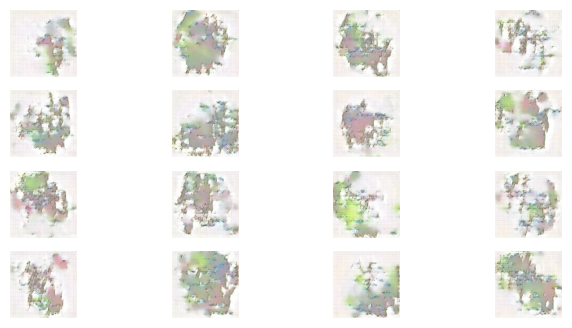

 62%|██████▏   | 311/500 [44:47<27:28,  8.72s/it]

Time for epoch 311 is 7.274169683456421 sec
Training started with  epoch 312 with 7 batches..


 62%|██████▏   | 312/500 [44:57<28:45,  9.18s/it]

Losses after epoch   312: generator 13.229, discriminator 0.879,               real_score 65.28%, fake_score 0.00%
Time for epoch 312 is 10.240129947662354 sec
Training started with  epoch 313 with 7 batches..


 63%|██████▎   | 313/500 [45:04<26:23,  8.47s/it]

Losses after epoch   313: generator 5.164, discriminator 0.053,               real_score 99.42%, fake_score 3.94%
Time for epoch 313 is 6.802319288253784 sec
Training started with  epoch 314 with 7 batches..


 63%|██████▎   | 314/500 [45:11<24:36,  7.94s/it]

Losses after epoch   314: generator 4.970, discriminator 0.067,               real_score 99.49%, fake_score 4.64%
Time for epoch 314 is 6.708827257156372 sec
Training started with  epoch 315 with 7 batches..


 63%|██████▎   | 315/500 [45:18<23:27,  7.61s/it]

Losses after epoch   315: generator 5.085, discriminator 0.057,               real_score 98.41%, fake_score 3.32%
Time for epoch 315 is 6.83925199508667 sec
Training started with  epoch 316 with 7 batches..


 63%|██████▎   | 316/500 [45:24<22:29,  7.33s/it]

Losses after epoch   316: generator 4.787, discriminator 0.046,               real_score 98.38%, fake_score 2.78%
Time for epoch 316 is 6.681617259979248 sec
Training started with  epoch 317 with 7 batches..


 63%|██████▎   | 317/500 [45:31<21:50,  7.16s/it]

Losses after epoch   317: generator 3.136, discriminator 0.212,               real_score 99.33%, fake_score 14.34%
Time for epoch 317 is 6.7529826164245605 sec
Training started with  epoch 318 with 7 batches..


 64%|██████▎   | 318/500 [45:41<24:31,  8.08s/it]

Losses after epoch   318: generator 4.100, discriminator 0.079,               real_score 99.62%, fake_score 6.30%
Time for epoch 318 is 10.23876166343689 sec
Training started with  epoch 319 with 7 batches..


 64%|██████▍   | 319/500 [45:51<26:20,  8.73s/it]

Losses after epoch   319: generator 4.631, discriminator 0.062,               real_score 98.93%, fake_score 4.17%
Time for epoch 319 is 10.23776125907898 sec
Training started with  epoch 320 with 7 batches..


 64%|██████▍   | 320/500 [46:02<27:33,  9.18s/it]

Losses after epoch   320: generator 5.045, discriminator 0.067,               real_score 98.28%, fake_score 3.12%
Time for epoch 320 is 10.240754842758179 sec
Training started with  epoch 321 with 7 batches..
Losses after epoch   321: generator 6.758, discriminator 0.063,               real_score 95.41%, fake_score 1.02%


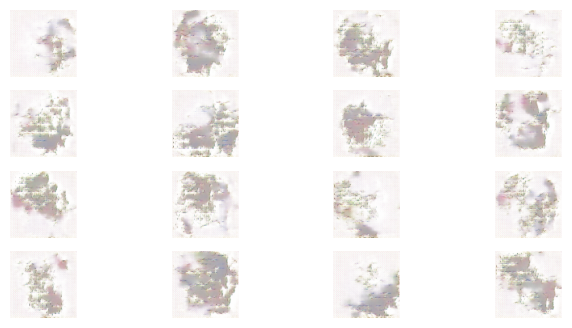

 64%|██████▍   | 321/500 [46:09<25:45,  8.63s/it]

Time for epoch 321 is 7.3418779373168945 sec
Training started with  epoch 322 with 7 batches..


 64%|██████▍   | 322/500 [46:16<23:54,  8.06s/it]

Losses after epoch   322: generator 5.748, discriminator 0.045,               real_score 97.83%, fake_score 2.09%
Time for epoch 322 is 6.719847202301025 sec
Training started with  epoch 323 with 7 batches..


 65%|██████▍   | 323/500 [46:23<22:37,  7.67s/it]

Losses after epoch   323: generator 4.774, discriminator 0.067,               real_score 98.09%, fake_score 4.07%
Time for epoch 323 is 6.757788181304932 sec
Training started with  epoch 324 with 7 batches..


 65%|██████▍   | 324/500 [46:29<21:39,  7.38s/it]

Losses after epoch   324: generator 5.471, discriminator 0.067,               real_score 97.11%, fake_score 2.79%
Time for epoch 324 is 6.714772462844849 sec
Training started with  epoch 325 with 7 batches..


 65%|██████▌   | 325/500 [46:40<24:02,  8.24s/it]

Losses after epoch   325: generator 7.650, discriminator 0.043,               real_score 96.66%, fake_score 0.29%
Time for epoch 325 is 10.237117528915405 sec
Training started with  epoch 326 with 7 batches..


 65%|██████▌   | 326/500 [46:46<22:37,  7.80s/it]

Losses after epoch   326: generator 6.444, discriminator 0.121,               real_score 91.31%, fake_score 0.61%
Time for epoch 326 is 6.782722473144531 sec
Training started with  epoch 327 with 7 batches..


 65%|██████▌   | 327/500 [46:53<21:32,  7.47s/it]

Losses after epoch   327: generator 4.146, discriminator 0.098,               real_score 99.02%, fake_score 6.59%
Time for epoch 327 is 6.696707010269165 sec
Training started with  epoch 328 with 7 batches..


 66%|██████▌   | 328/500 [47:03<23:47,  8.30s/it]

Losses after epoch   328: generator 5.858, discriminator 0.023,               real_score 99.37%, fake_score 1.58%
Time for epoch 328 is 10.23467469215393 sec
Training started with  epoch 329 with 7 batches..


 66%|██████▌   | 329/500 [47:10<22:22,  7.85s/it]

Losses after epoch   329: generator 4.947, discriminator 0.054,               real_score 99.37%, fake_score 4.05%
Time for epoch 329 is 6.805298328399658 sec
Training started with  epoch 330 with 7 batches..


 66%|██████▌   | 330/500 [47:17<21:22,  7.54s/it]

Losses after epoch   330: generator 2.789, discriminator 0.256,               real_score 99.74%, fake_score 16.96%
Time for epoch 330 is 6.8126630783081055 sec
Training started with  epoch 331 with 7 batches..
Losses after epoch   331: generator 4.779, discriminator 0.049,               real_score 99.41%, fake_score 3.83%


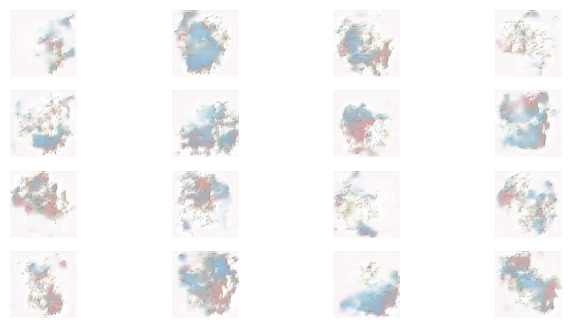

 66%|██████▌   | 331/500 [47:28<23:59,  8.52s/it]

Time for epoch 331 is 10.794470310211182 sec
Training started with  epoch 332 with 7 batches..


 66%|██████▋   | 332/500 [47:38<25:18,  9.04s/it]

Losses after epoch   332: generator 2.452, discriminator 0.295,               real_score 99.65%, fake_score 19.73%
Time for epoch 332 is 10.241565704345703 sec
Training started with  epoch 333 with 7 batches..


 67%|██████▋   | 333/500 [47:45<23:14,  8.35s/it]

Losses after epoch   333: generator 0.004, discriminator 9.297,               real_score 100.00%, fake_score 99.65%
Time for epoch 333 is 6.755093574523926 sec
Training started with  epoch 334 with 7 batches..


 67%|██████▋   | 334/500 [47:51<21:48,  7.88s/it]

Losses after epoch   334: generator 1.321, discriminator 1.175,               real_score 100.00%, fake_score 49.11%
Time for epoch 334 is 6.792187929153442 sec
Training started with  epoch 335 with 7 batches..


 67%|██████▋   | 335/500 [47:58<20:44,  7.54s/it]

Losses after epoch   335: generator 6.709, discriminator 0.215,               real_score 86.64%, fake_score 1.37%
Time for epoch 335 is 6.733202695846558 sec
Training started with  epoch 336 with 7 batches..


 67%|██████▋   | 336/500 [48:08<22:49,  8.35s/it]

Losses after epoch   336: generator 0.684, discriminator 2.544,               real_score 100.00%, fake_score 70.92%
Time for epoch 336 is 10.23471975326538 sec
Training started with  epoch 337 with 7 batches..


 67%|██████▋   | 337/500 [48:15<21:27,  7.90s/it]

Losses after epoch   337: generator 17.597, discriminator 0.220,               real_score 88.53%, fake_score 0.00%
Time for epoch 337 is 6.846564769744873 sec
Training started with  epoch 338 with 7 batches..


 68%|██████▊   | 338/500 [48:22<20:21,  7.54s/it]

Losses after epoch   338: generator 8.612, discriminator 0.021,               real_score 98.49%, fake_score 0.37%
Time for epoch 338 is 6.6939404010772705 sec
Training started with  epoch 339 with 7 batches..


 68%|██████▊   | 339/500 [48:29<19:39,  7.32s/it]

Losses after epoch   339: generator 5.303, discriminator 0.050,               real_score 99.77%, fake_score 4.02%
Time for epoch 339 is 6.821558475494385 sec
Training started with  epoch 340 with 7 batches..


 68%|██████▊   | 340/500 [48:39<21:51,  8.20s/it]

Losses after epoch   340: generator 0.950, discriminator 1.348,               real_score 99.83%, fake_score 55.45%
Time for epoch 340 is 10.237110137939453 sec
Training started with  epoch 341 with 7 batches..
Losses after epoch   341: generator 7.881, discriminator 0.122,               real_score 92.44%, fake_score 1.32%


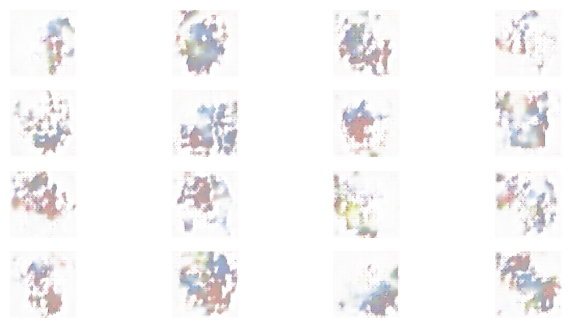

 68%|██████▊   | 341/500 [48:47<21:14,  8.02s/it]

Time for epoch 341 is 7.5856773853302 sec
Training started with  epoch 342 with 7 batches..


 68%|██████▊   | 342/500 [48:53<20:12,  7.67s/it]

Losses after epoch   342: generator 19.348, discriminator 4.117,               real_score 9.69%, fake_score 0.00%
Time for epoch 342 is 6.877037286758423 sec
Training started with  epoch 343 with 7 batches..


 69%|██████▊   | 343/500 [49:00<19:20,  7.39s/it]

Losses after epoch   343: generator 5.761, discriminator 0.141,               real_score 91.74%, fake_score 3.15%
Time for epoch 343 is 6.723566770553589 sec
Training started with  epoch 344 with 7 batches..


 69%|██████▉   | 344/500 [49:07<18:47,  7.23s/it]

Losses after epoch   344: generator 11.334, discriminator 0.006,               real_score 99.46%, fake_score 0.03%
Time for epoch 344 is 6.846937894821167 sec
Training started with  epoch 345 with 7 batches..


 69%|██████▉   | 345/500 [49:14<18:21,  7.11s/it]

Losses after epoch   345: generator 20.585, discriminator 0.216,               real_score 85.46%, fake_score 0.00%
Time for epoch 345 is 6.82106614112854 sec
Training started with  epoch 346 with 7 batches..


 69%|██████▉   | 346/500 [49:24<20:38,  8.04s/it]

Losses after epoch   346: generator 0.710, discriminator 1.932,               real_score 100.00%, fake_score 65.93%
Time for epoch 346 is 10.23368525505066 sec
Training started with  epoch 347 with 7 batches..


 69%|██████▉   | 347/500 [49:34<22:11,  8.70s/it]

Losses after epoch   347: generator 5.557, discriminator 0.136,               real_score 92.79%, fake_score 3.21%
Time for epoch 347 is 10.235020637512207 sec
Training started with  epoch 348 with 7 batches..


 70%|██████▉   | 348/500 [49:41<20:34,  8.12s/it]

Losses after epoch   348: generator 4.738, discriminator 0.138,               real_score 97.49%, fake_score 7.16%
Time for epoch 348 is 6.772637367248535 sec
Training started with  epoch 349 with 7 batches..


 70%|██████▉   | 349/500 [49:48<19:27,  7.73s/it]

Losses after epoch   349: generator 6.477, discriminator 0.070,               real_score 95.08%, fake_score 1.43%
Time for epoch 349 is 6.816449880599976 sec
Training started with  epoch 350 with 7 batches..


 70%|███████   | 350/500 [49:55<18:35,  7.44s/it]

Losses after epoch   350: generator 0.244, discriminator 3.384,               real_score 100.00%, fake_score 86.31%
Time for epoch 350 is 6.753417730331421 sec
Training started with  epoch 351 with 7 batches..
Losses after epoch   351: generator 3.399, discriminator 0.189,               real_score 99.97%, fake_score 13.15%


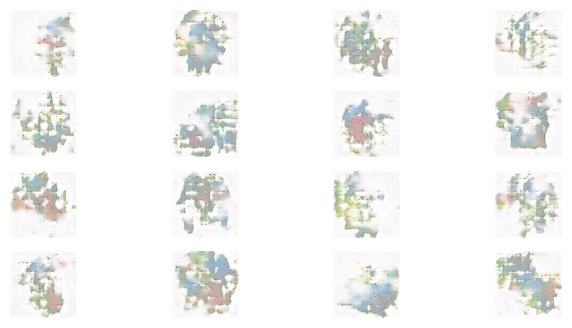

 70%|███████   | 351/500 [50:06<20:58,  8.45s/it]

Time for epoch 351 is 10.8006591796875 sec
Training started with  epoch 352 with 7 batches..


 70%|███████   | 352/500 [50:16<22:10,  8.99s/it]

Losses after epoch   352: generator 2.622, discriminator 0.412,               real_score 98.84%, fake_score 22.09%
Time for epoch 352 is 10.24404501914978 sec
Training started with  epoch 353 with 7 batches..


 71%|███████   | 353/500 [50:23<20:28,  8.36s/it]

Losses after epoch   353: generator 5.380, discriminator 0.101,               real_score 93.94%, fake_score 2.71%
Time for epoch 353 is 6.891445636749268 sec
Training started with  epoch 354 with 7 batches..


 71%|███████   | 354/500 [50:29<19:08,  7.86s/it]

Losses after epoch   354: generator 1.299, discriminator 1.032,               real_score 100.00%, fake_score 46.39%
Time for epoch 354 is 6.7084574699401855 sec
Training started with  epoch 355 with 7 batches..


 71%|███████   | 355/500 [50:40<20:44,  8.58s/it]

Losses after epoch   355: generator 4.957, discriminator 0.199,               real_score 93.58%, fake_score 5.49%
Time for epoch 355 is 10.246166944503784 sec
Training started with  epoch 356 with 7 batches..


 71%|███████   | 356/500 [50:46<19:19,  8.05s/it]

Losses after epoch   356: generator 3.604, discriminator 0.239,               real_score 93.03%, fake_score 11.51%
Time for epoch 356 is 6.821624755859375 sec
Training started with  epoch 357 with 7 batches..


 71%|███████▏  | 357/500 [50:57<20:45,  8.71s/it]

Losses after epoch   357: generator 4.967, discriminator 0.119,               real_score 94.31%, fake_score 3.08%
Time for epoch 357 is 10.241880893707275 sec
Training started with  epoch 358 with 7 batches..


 72%|███████▏  | 358/500 [51:04<19:17,  8.15s/it]

Losses after epoch   358: generator 4.982, discriminator 0.107,               real_score 94.70%, fake_score 3.66%
Time for epoch 358 is 6.843839883804321 sec
Training started with  epoch 359 with 7 batches..


 72%|███████▏  | 359/500 [51:14<20:37,  8.78s/it]

Losses after epoch   359: generator 5.723, discriminator 0.178,               real_score 89.04%, fake_score 2.43%
Time for epoch 359 is 10.242202043533325 sec
Training started with  epoch 360 with 7 batches..


 72%|███████▏  | 360/500 [51:24<21:30,  9.22s/it]

Losses after epoch   360: generator 5.153, discriminator 0.088,               real_score 96.92%, fake_score 4.25%
Time for epoch 360 is 10.237438201904297 sec
Training started with  epoch 361 with 7 batches..
Losses after epoch   361: generator 5.214, discriminator 0.159,               real_score 91.37%, fake_score 3.57%


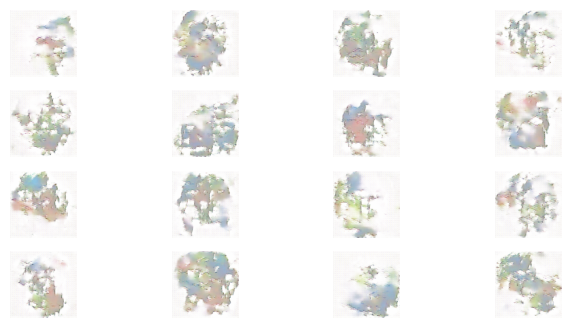

 72%|███████▏  | 361/500 [51:31<20:03,  8.66s/it]

Time for epoch 361 is 7.341725587844849 sec
Training started with  epoch 362 with 7 batches..


 72%|███████▏  | 362/500 [51:42<21:00,  9.13s/it]

Losses after epoch   362: generator 4.606, discriminator 0.081,               real_score 98.06%, fake_score 5.10%
Time for epoch 362 is 10.244358777999878 sec
Training started with  epoch 363 with 7 batches..


 73%|███████▎  | 363/500 [51:52<21:36,  9.46s/it]

Losses after epoch   363: generator 5.288, discriminator 0.116,               real_score 92.59%, fake_score 2.96%
Time for epoch 363 is 10.23603081703186 sec
Training started with  epoch 364 with 7 batches..


 73%|███████▎  | 364/500 [52:02<21:58,  9.70s/it]

Losses after epoch   364: generator 5.335, discriminator 0.150,               real_score 91.48%, fake_score 2.47%
Time for epoch 364 is 10.237183094024658 sec
Training started with  epoch 365 with 7 batches..


 73%|███████▎  | 365/500 [52:12<22:10,  9.86s/it]

Losses after epoch   365: generator 5.118, discriminator 0.074,               real_score 96.04%, fake_score 2.74%
Time for epoch 365 is 10.235017538070679 sec
Training started with  epoch 366 with 7 batches..


 73%|███████▎  | 366/500 [52:23<22:16,  9.98s/it]

Losses after epoch   366: generator 5.441, discriminator 0.099,               real_score 94.31%, fake_score 2.80%
Time for epoch 366 is 10.251023292541504 sec
Training started with  epoch 367 with 7 batches..


 73%|███████▎  | 367/500 [52:33<22:17, 10.06s/it]

Losses after epoch   367: generator 4.925, discriminator 0.098,               real_score 96.60%, fake_score 4.10%
Time for epoch 367 is 10.236888408660889 sec
Training started with  epoch 368 with 7 batches..


 74%|███████▎  | 368/500 [52:40<19:59,  9.09s/it]

Losses after epoch   368: generator 5.087, discriminator 0.046,               real_score 98.90%, fake_score 3.02%
Time for epoch 368 is 6.822230577468872 sec
Training started with  epoch 369 with 7 batches..


 74%|███████▍  | 369/500 [52:46<18:15,  8.36s/it]

Losses after epoch   369: generator 4.782, discriminator 0.086,               real_score 96.88%, fake_score 4.32%
Time for epoch 369 is 6.673866510391235 sec
Training started with  epoch 370 with 7 batches..


 74%|███████▍  | 370/500 [52:53<17:03,  7.87s/it]

Losses after epoch   370: generator 5.044, discriminator 0.074,               real_score 97.27%, fake_score 3.49%
Time for epoch 370 is 6.718017816543579 sec
Training started with  epoch 371 with 7 batches..
Losses after epoch   371: generator 5.197, discriminator 0.050,               real_score 97.79%, fake_score 2.36%


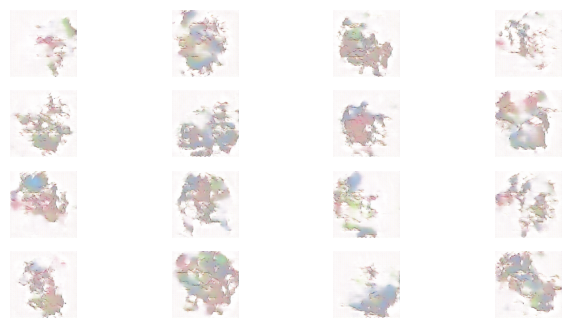

 74%|███████▍  | 371/500 [53:04<18:57,  8.82s/it]

Time for epoch 371 is 11.024382591247559 sec
Training started with  epoch 372 with 7 batches..


 74%|███████▍  | 372/500 [53:11<17:32,  8.22s/it]

Losses after epoch   372: generator 5.333, discriminator 0.068,               real_score 96.19%, fake_score 2.29%
Time for epoch 372 is 6.834065675735474 sec
Training started with  epoch 373 with 7 batches..


 75%|███████▍  | 373/500 [53:18<16:27,  7.78s/it]

Losses after epoch   373: generator 4.750, discriminator 0.097,               real_score 97.03%, fake_score 4.88%
Time for epoch 373 is 6.741192579269409 sec
Training started with  epoch 374 with 7 batches..


 75%|███████▍  | 374/500 [53:24<15:40,  7.46s/it]

Losses after epoch   374: generator 5.820, discriminator 0.091,               real_score 94.80%, fake_score 2.61%
Time for epoch 374 is 6.725405216217041 sec
Training started with  epoch 375 with 7 batches..


 75%|███████▌  | 375/500 [53:31<15:07,  7.26s/it]

Losses after epoch   375: generator 5.360, discriminator 0.090,               real_score 94.46%, fake_score 2.19%
Time for epoch 375 is 6.782047748565674 sec
Training started with  epoch 376 with 7 batches..


 75%|███████▌  | 376/500 [53:38<14:39,  7.09s/it]

Losses after epoch   376: generator 4.742, discriminator 0.096,               real_score 96.11%, fake_score 4.34%
Time for epoch 376 is 6.701698303222656 sec
Training started with  epoch 377 with 7 batches..


 75%|███████▌  | 377/500 [53:45<14:22,  7.01s/it]

Losses after epoch   377: generator 5.586, discriminator 0.123,               real_score 92.68%, fake_score 2.59%
Time for epoch 377 is 6.814310312271118 sec
Training started with  epoch 378 with 7 batches..


 76%|███████▌  | 378/500 [53:51<14:04,  6.92s/it]

Losses after epoch   378: generator 8.002, discriminator 0.281,               real_score 79.77%, fake_score 0.14%
Time for epoch 378 is 6.700493812561035 sec
Training started with  epoch 379 with 7 batches..


 76%|███████▌  | 379/500 [53:58<13:51,  6.87s/it]

Losses after epoch   379: generator 5.578, discriminator 0.060,               real_score 97.46%, fake_score 2.77%
Time for epoch 379 is 6.7532877922058105 sec
Training started with  epoch 380 with 7 batches..


 76%|███████▌  | 380/500 [54:05<13:40,  6.84s/it]

Losses after epoch   380: generator 5.535, discriminator 0.066,               real_score 96.65%, fake_score 2.45%
Time for epoch 380 is 6.762578964233398 sec
Training started with  epoch 381 with 7 batches..
Losses after epoch   381: generator 2.769, discriminator 0.248,               real_score 99.64%, fake_score 17.56%


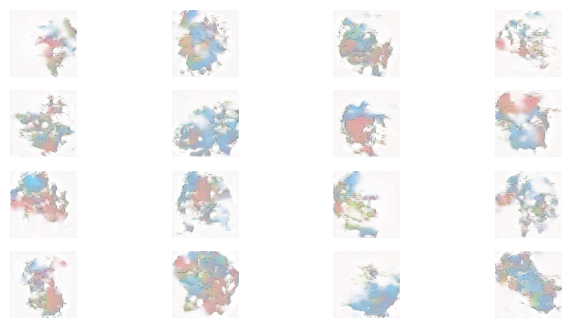

 76%|███████▌  | 381/500 [54:16<16:04,  8.11s/it]

Time for epoch 381 is 11.064947128295898 sec
Training started with  epoch 382 with 7 batches..


 76%|███████▋  | 382/500 [54:23<15:11,  7.72s/it]

Losses after epoch   382: generator 10.627, discriminator 0.047,               real_score 96.49%, fake_score 0.05%
Time for epoch 382 is 6.820180177688599 sec
Training started with  epoch 383 with 7 batches..


 77%|███████▋  | 383/500 [54:29<14:28,  7.42s/it]

Losses after epoch   383: generator 0.041, discriminator 6.889,               real_score 100.00%, fake_score 97.71%
Time for epoch 383 is 6.727707386016846 sec
Training started with  epoch 384 with 7 batches..


 77%|███████▋  | 384/500 [54:40<15:59,  8.27s/it]

Losses after epoch   384: generator 4.365, discriminator 0.177,               real_score 99.64%, fake_score 11.25%
Time for epoch 384 is 10.234826564788818 sec
Training started with  epoch 385 with 7 batches..


 77%|███████▋  | 385/500 [54:47<15:00,  7.83s/it]

Losses after epoch   385: generator 6.640, discriminator 0.072,               real_score 95.13%, fake_score 1.37%
Time for epoch 385 is 6.799407005310059 sec
Training started with  epoch 386 with 7 batches..


 77%|███████▋  | 386/500 [54:53<14:20,  7.54s/it]

Losses after epoch   386: generator 5.839, discriminator 0.168,               real_score 90.55%, fake_score 2.50%
Time for epoch 386 is 6.881974458694458 sec
Training started with  epoch 387 with 7 batches..


 77%|███████▋  | 387/500 [55:04<15:43,  8.35s/it]

Losses after epoch   387: generator 5.537, discriminator 0.089,               real_score 95.40%, fake_score 3.01%
Time for epoch 387 is 10.234797239303589 sec
Training started with  epoch 388 with 7 batches..


 78%|███████▊  | 388/500 [55:10<14:41,  7.87s/it]

Losses after epoch   388: generator 5.283, discriminator 0.150,               real_score 92.25%, fake_score 4.50%
Time for epoch 388 is 6.743772029876709 sec
Training started with  epoch 389 with 7 batches..


 78%|███████▊  | 389/500 [55:17<13:57,  7.55s/it]

Losses after epoch   389: generator 4.790, discriminator 0.087,               real_score 96.32%, fake_score 4.04%
Time for epoch 389 is 6.791604518890381 sec
Training started with  epoch 390 with 7 batches..


 78%|███████▊  | 390/500 [55:27<15:18,  8.35s/it]

Losses after epoch   390: generator 3.886, discriminator 0.175,               real_score 98.30%, fake_score 10.50%
Time for epoch 390 is 10.233995914459229 sec
Training started with  epoch 391 with 7 batches..
Losses after epoch   391: generator 6.079, discriminator 0.135,               real_score 91.17%, fake_score 2.07%


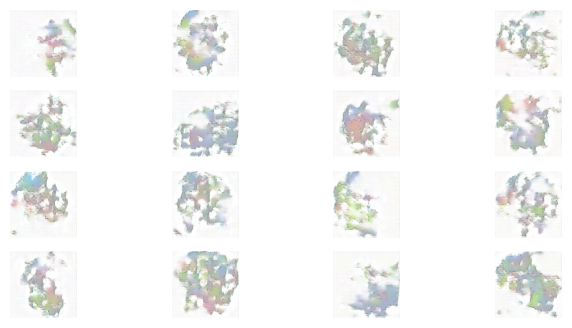

 78%|███████▊  | 391/500 [55:35<14:37,  8.05s/it]

Time for epoch 391 is 7.341317415237427 sec
Training started with  epoch 392 with 7 batches..


 78%|███████▊  | 392/500 [55:45<15:40,  8.71s/it]

Losses after epoch   392: generator 5.787, discriminator 0.161,               real_score 89.64%, fake_score 2.04%
Time for epoch 392 is 10.236323118209839 sec
Training started with  epoch 393 with 7 batches..


 79%|███████▊  | 393/500 [55:55<16:20,  9.17s/it]

Losses after epoch   393: generator 5.974, discriminator 0.128,               real_score 92.30%, fake_score 1.88%
Time for epoch 393 is 10.235446453094482 sec
Training started with  epoch 394 with 7 batches..


 79%|███████▉  | 394/500 [56:05<16:45,  9.49s/it]

Losses after epoch   394: generator 5.717, discriminator 0.146,               real_score 90.29%, fake_score 2.39%
Time for epoch 394 is 10.23800778388977 sec
Training started with  epoch 395 with 7 batches..


 79%|███████▉  | 395/500 [56:12<15:09,  8.66s/it]

Losses after epoch   395: generator 7.111, discriminator 0.206,               real_score 86.14%, fake_score 0.66%
Time for epoch 395 is 6.7430055141448975 sec
Training started with  epoch 396 with 7 batches..


 79%|███████▉  | 396/500 [56:22<15:50,  9.14s/it]

Losses after epoch   396: generator 5.346, discriminator 0.078,               real_score 96.56%, fake_score 3.16%
Time for epoch 396 is 10.233640909194946 sec
Training started with  epoch 397 with 7 batches..


 79%|███████▉  | 397/500 [56:29<14:27,  8.43s/it]

Losses after epoch   397: generator 5.346, discriminator 0.062,               real_score 97.04%, fake_score 2.68%
Time for epoch 397 is 6.767176151275635 sec
Training started with  epoch 398 with 7 batches..


 80%|███████▉  | 398/500 [56:39<15:14,  8.97s/it]

Losses after epoch   398: generator 5.380, discriminator 0.091,               real_score 95.65%, fake_score 2.98%
Time for epoch 398 is 10.23881196975708 sec
Training started with  epoch 399 with 7 batches..


 80%|███████▉  | 399/500 [56:46<14:01,  8.33s/it]

Losses after epoch   399: generator 7.310, discriminator 0.172,               real_score 88.18%, fake_score 0.89%
Time for epoch 399 is 6.833019733428955 sec
Training started with  epoch 400 with 7 batches..


 80%|████████  | 400/500 [56:53<13:04,  7.84s/it]

Losses after epoch   400: generator 4.510, discriminator 0.089,               real_score 99.15%, fake_score 6.32%
Time for epoch 400 is 6.695997714996338 sec
Training started with  epoch 401 with 7 batches..
Losses after epoch   401: generator 29.916, discriminator 15.781,               real_score 0.00%, fake_score 0.00%


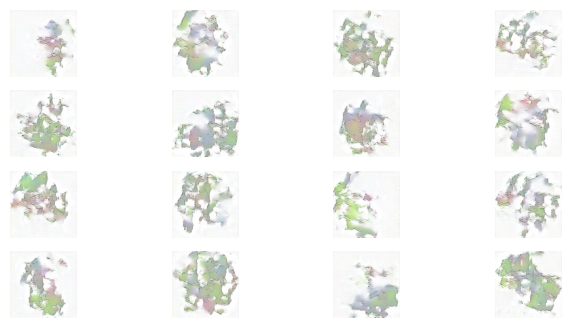

 80%|████████  | 401/500 [57:04<14:24,  8.73s/it]

Time for epoch 401 is 10.818847179412842 sec
Training started with  epoch 402 with 7 batches..


 80%|████████  | 402/500 [57:11<13:20,  8.17s/it]

Losses after epoch   402: generator 5.762, discriminator 0.098,               real_score 98.54%, fake_score 3.82%
Time for epoch 402 is 6.835945129394531 sec
Training started with  epoch 403 with 7 batches..


 81%|████████  | 403/500 [57:21<14:12,  8.79s/it]

Losses after epoch   403: generator 4.415, discriminator 0.158,               real_score 99.99%, fake_score 9.13%
Time for epoch 403 is 10.23443078994751 sec
Training started with  epoch 404 with 7 batches..


 81%|████████  | 404/500 [57:31<14:45,  9.22s/it]

Losses after epoch   404: generator 20.588, discriminator 5.786,               real_score 11.15%, fake_score 0.00%
Time for epoch 404 is 10.236977577209473 sec
Training started with  epoch 405 with 7 batches..


 81%|████████  | 405/500 [57:41<15:05,  9.53s/it]

Losses after epoch   405: generator 8.110, discriminator 0.007,               real_score 100.00%, fake_score 0.65%
Time for epoch 405 is 10.241774082183838 sec
Training started with  epoch 406 with 7 batches..


 81%|████████  | 406/500 [57:52<15:15,  9.74s/it]

Losses after epoch   406: generator 6.669, discriminator 0.036,               real_score 99.68%, fake_score 2.55%
Time for epoch 406 is 10.23451566696167 sec
Training started with  epoch 407 with 7 batches..


 81%|████████▏ | 407/500 [58:02<15:19,  9.89s/it]

Losses after epoch   407: generator 4.389, discriminator 0.094,               real_score 99.98%, fake_score 7.30%
Time for epoch 407 is 10.235100030899048 sec
Training started with  epoch 408 with 7 batches..


 82%|████████▏ | 408/500 [58:12<15:19, 10.00s/it]

Losses after epoch   408: generator 6.322, discriminator 0.047,               real_score 99.42%, fake_score 2.90%
Time for epoch 408 is 10.242084503173828 sec
Training started with  epoch 409 with 7 batches..


 82%|████████▏ | 409/500 [58:22<15:16, 10.07s/it]

Losses after epoch   409: generator 6.977, discriminator 0.028,               real_score 98.40%, fake_score 1.06%
Time for epoch 409 is 10.239129543304443 sec
Training started with  epoch 410 with 7 batches..


 82%|████████▏ | 410/500 [58:29<13:35,  9.06s/it]

Losses after epoch   410: generator 2.860, discriminator 0.413,               real_score 99.76%, fake_score 20.92%
Time for epoch 410 is 6.700696229934692 sec
Training started with  epoch 411 with 7 batches..
Losses after epoch   411: generator 6.528, discriminator 0.043,               real_score 97.85%, fake_score 1.71%


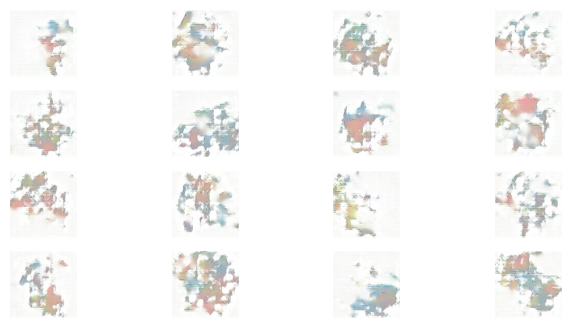

 82%|████████▏ | 411/500 [58:36<12:39,  8.53s/it]

Time for epoch 411 is 7.286539793014526 sec
Training started with  epoch 412 with 7 batches..


 82%|████████▏ | 412/500 [58:43<11:42,  7.98s/it]

Losses after epoch   412: generator 5.467, discriminator 0.062,               real_score 97.73%, fake_score 2.49%
Time for epoch 412 is 6.703692436218262 sec
Training started with  epoch 413 with 7 batches..


 83%|████████▎ | 413/500 [58:50<11:00,  7.60s/it]

Losses after epoch   413: generator 3.747, discriminator 0.137,               real_score 99.38%, fake_score 10.30%
Time for epoch 413 is 6.697650194168091 sec
Training started with  epoch 414 with 7 batches..


 83%|████████▎ | 414/500 [58:56<10:29,  7.32s/it]

Losses after epoch   414: generator 1.638, discriminator 0.810,               real_score 99.96%, fake_score 38.41%
Time for epoch 414 is 6.67861533164978 sec
Training started with  epoch 415 with 7 batches..


 83%|████████▎ | 415/500 [59:03<10:09,  7.17s/it]

Losses after epoch   415: generator 4.972, discriminator 0.064,               real_score 99.57%, fake_score 3.82%
Time for epoch 415 is 6.7997846603393555 sec
Training started with  epoch 416 with 7 batches..


 83%|████████▎ | 416/500 [59:10<09:49,  7.02s/it]

Losses after epoch   416: generator 5.802, discriminator 0.133,               real_score 93.31%, fake_score 3.71%
Time for epoch 416 is 6.666215419769287 sec
Training started with  epoch 417 with 7 batches..


 83%|████████▎ | 417/500 [59:20<11:02,  7.98s/it]

Losses after epoch   417: generator 6.386, discriminator 0.109,               real_score 92.61%, fake_score 1.79%
Time for epoch 417 is 10.234392881393433 sec
Training started with  epoch 418 with 7 batches..


 84%|████████▎ | 418/500 [59:30<11:50,  8.66s/it]

Losses after epoch   418: generator 4.314, discriminator 0.110,               real_score 97.66%, fake_score 6.50%
Time for epoch 418 is 10.243994235992432 sec
Training started with  epoch 419 with 7 batches..


 84%|████████▍ | 419/500 [59:41<12:19,  9.13s/it]

Losses after epoch   419: generator 4.199, discriminator 0.126,               real_score 97.91%, fake_score 6.94%
Time for epoch 419 is 10.234872341156006 sec
Training started with  epoch 420 with 7 batches..


 84%|████████▍ | 420/500 [59:47<11:12,  8.40s/it]

Losses after epoch   420: generator 3.958, discriminator 0.127,               real_score 99.31%, fake_score 8.63%
Time for epoch 420 is 6.699518918991089 sec
Training started with  epoch 421 with 7 batches..
Losses after epoch   421: generator 4.183, discriminator 0.101,               real_score 98.66%, fake_score 6.46%


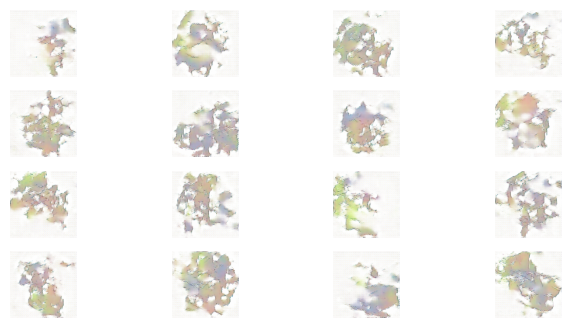

 84%|████████▍ | 421/500 [59:58<12:07,  9.21s/it]

Time for epoch 421 is 11.074628353118896 sec
Training started with  epoch 422 with 7 batches..


 84%|████████▍ | 422/500 [1:00:09<12:22,  9.52s/it]

Losses after epoch   422: generator 5.047, discriminator 0.069,               real_score 96.78%, fake_score 3.00%
Time for epoch 422 is 10.24135422706604 sec
Training started with  epoch 423 with 7 batches..


 85%|████████▍ | 423/500 [1:00:15<11:09,  8.69s/it]

Losses after epoch   423: generator 3.831, discriminator 0.140,               real_score 98.98%, fake_score 9.09%
Time for epoch 423 is 6.758824825286865 sec
Training started with  epoch 424 with 7 batches..


 85%|████████▍ | 424/500 [1:00:22<10:17,  8.12s/it]

Losses after epoch   424: generator 5.618, discriminator 0.069,               real_score 95.97%, fake_score 2.21%
Time for epoch 424 is 6.78905177116394 sec
Training started with  epoch 425 with 7 batches..


 85%|████████▌ | 425/500 [1:00:29<09:37,  7.70s/it]

Losses after epoch   425: generator 4.083, discriminator 0.076,               real_score 99.24%, fake_score 5.47%
Time for epoch 425 is 6.725460052490234 sec
Training started with  epoch 426 with 7 batches..


 85%|████████▌ | 426/500 [1:00:39<10:26,  8.46s/it]

Losses after epoch   426: generator 5.100, discriminator 0.056,               real_score 97.75%, fake_score 2.87%
Time for epoch 426 is 10.240376472473145 sec
Training started with  epoch 427 with 7 batches..


 85%|████████▌ | 427/500 [1:00:46<09:41,  7.96s/it]

Losses after epoch   427: generator 3.807, discriminator 0.103,               real_score 99.13%, fake_score 7.50%
Time for epoch 427 is 6.785966634750366 sec
Training started with  epoch 428 with 7 batches..


 86%|████████▌ | 428/500 [1:00:56<10:22,  8.64s/it]

Losses after epoch   428: generator 5.471, discriminator 0.082,               real_score 96.24%, fake_score 3.01%
Time for epoch 428 is 10.235603332519531 sec
Training started with  epoch 429 with 7 batches..


 86%|████████▌ | 429/500 [1:01:03<09:33,  8.07s/it]

Losses after epoch   429: generator 4.303, discriminator 0.084,               real_score 98.58%, fake_score 5.91%
Time for epoch 429 is 6.733653545379639 sec
Training started with  epoch 430 with 7 batches..


 86%|████████▌ | 430/500 [1:01:10<08:57,  7.68s/it]

Losses after epoch   430: generator 3.478, discriminator 0.156,               real_score 98.95%, fake_score 11.01%
Time for epoch 430 is 6.751006126403809 sec
Training started with  epoch 431 with 7 batches..
Losses after epoch   431: generator 4.628, discriminator 0.100,               real_score 98.86%, fake_score 6.42%


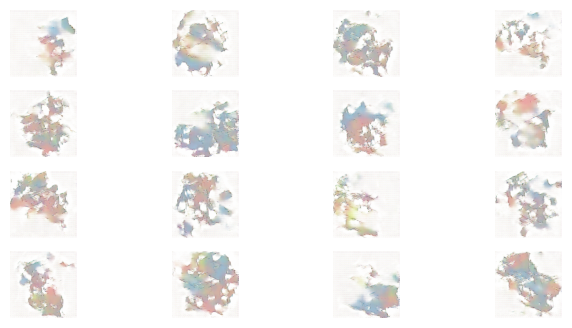

 86%|████████▌ | 431/500 [1:01:20<09:54,  8.62s/it]

Time for epoch 431 is 10.819314241409302 sec
Training started with  epoch 432 with 7 batches..


 86%|████████▋ | 432/500 [1:01:27<09:07,  8.06s/it]

Losses after epoch   432: generator 5.684, discriminator 0.078,               real_score 95.14%, fake_score 1.94%
Time for epoch 432 is 6.746845722198486 sec
Training started with  epoch 433 with 7 batches..


 87%|████████▋ | 433/500 [1:01:34<08:33,  7.67s/it]

Losses after epoch   433: generator 5.416, discriminator 0.081,               real_score 95.84%, fake_score 2.80%
Time for epoch 433 is 6.753331899642944 sec
Training started with  epoch 434 with 7 batches..


 87%|████████▋ | 434/500 [1:01:44<09:16,  8.44s/it]

Losses after epoch   434: generator 5.156, discriminator 0.065,               real_score 97.69%, fake_score 3.52%
Time for epoch 434 is 10.237989902496338 sec
Training started with  epoch 435 with 7 batches..


 87%|████████▋ | 435/500 [1:01:51<08:34,  7.92s/it]

Losses after epoch   435: generator 5.593, discriminator 0.059,               real_score 96.40%, fake_score 1.74%
Time for epoch 435 is 6.712320327758789 sec
Training started with  epoch 436 with 7 batches..


 87%|████████▋ | 436/500 [1:02:01<09:11,  8.62s/it]

Losses after epoch   436: generator 5.867, discriminator 0.061,               real_score 96.45%, fake_score 1.64%
Time for epoch 436 is 10.237168073654175 sec
Training started with  epoch 437 with 7 batches..


 87%|████████▋ | 437/500 [1:02:11<09:33,  9.10s/it]

Losses after epoch   437: generator 4.611, discriminator 0.113,               real_score 95.85%, fake_score 4.87%
Time for epoch 437 is 10.241073846817017 sec
Training started with  epoch 438 with 7 batches..


 88%|████████▊ | 438/500 [1:02:18<08:39,  8.38s/it]

Losses after epoch   438: generator 5.916, discriminator 0.039,               real_score 97.74%, fake_score 1.45%
Time for epoch 438 is 6.688732385635376 sec
Training started with  epoch 439 with 7 batches..


 88%|████████▊ | 439/500 [1:02:28<09:05,  8.94s/it]

Losses after epoch   439: generator 0.000, discriminator 15.455,               real_score 100.00%, fake_score 100.00%
Time for epoch 439 is 10.24346923828125 sec
Training started with  epoch 440 with 7 batches..


 88%|████████▊ | 440/500 [1:02:39<09:19,  9.33s/it]

Losses after epoch   440: generator 5.160, discriminator 0.073,               real_score 99.92%, fake_score 5.30%
Time for epoch 440 is 10.242392539978027 sec
Training started with  epoch 441 with 7 batches..
Losses after epoch   441: generator 5.434, discriminator 0.069,               real_score 97.86%, fake_score 3.66%


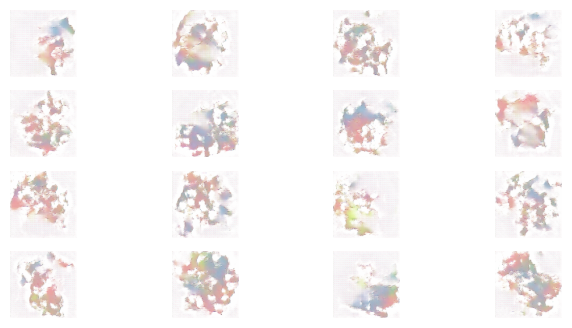

 88%|████████▊ | 441/500 [1:02:49<09:36,  9.78s/it]

Time for epoch 441 is 10.823889017105103 sec
Training started with  epoch 442 with 7 batches..


 88%|████████▊ | 442/500 [1:02:56<08:33,  8.85s/it]

Losses after epoch   442: generator 6.481, discriminator 0.062,               real_score 96.13%, fake_score 1.35%
Time for epoch 442 is 6.694485187530518 sec
Training started with  epoch 443 with 7 batches..


 89%|████████▊ | 443/500 [1:03:03<07:49,  8.23s/it]

Losses after epoch   443: generator 6.312, discriminator 0.084,               real_score 94.28%, fake_score 1.22%
Time for epoch 443 is 6.765569686889648 sec
Training started with  epoch 444 with 7 batches..


 89%|████████▉ | 444/500 [1:03:13<08:14,  8.83s/it]

Losses after epoch   444: generator 6.924, discriminator 0.157,               real_score 90.81%, fake_score 0.97%
Time for epoch 444 is 10.243507385253906 sec
Training started with  epoch 445 with 7 batches..


 89%|████████▉ | 445/500 [1:03:23<08:29,  9.26s/it]

Losses after epoch   445: generator 6.096, discriminator 0.110,               real_score 94.05%, fake_score 2.22%
Time for epoch 445 is 10.235962867736816 sec
Training started with  epoch 446 with 7 batches..


 89%|████████▉ | 446/500 [1:03:30<07:38,  8.50s/it]

Losses after epoch   446: generator 4.994, discriminator 0.096,               real_score 96.13%, fake_score 4.47%
Time for epoch 446 is 6.730699300765991 sec
Training started with  epoch 447 with 7 batches..


 89%|████████▉ | 447/500 [1:03:40<07:58,  9.02s/it]

Losses after epoch   447: generator 6.155, discriminator 0.091,               real_score 94.23%, fake_score 1.82%
Time for epoch 447 is 10.234865188598633 sec
Training started with  epoch 448 with 7 batches..


 90%|████████▉ | 448/500 [1:03:51<08:08,  9.38s/it]

Losses after epoch   448: generator 5.630, discriminator 0.058,               real_score 96.55%, fake_score 1.87%
Time for epoch 448 is 10.235451221466064 sec
Training started with  epoch 449 with 7 batches..


 90%|████████▉ | 449/500 [1:03:57<07:17,  8.58s/it]

Losses after epoch   449: generator 4.995, discriminator 0.083,               real_score 95.66%, fake_score 3.09%
Time for epoch 449 is 6.710434675216675 sec
Training started with  epoch 450 with 7 batches..


 90%|█████████ | 450/500 [1:04:08<07:33,  9.08s/it]

Losses after epoch   450: generator 5.095, discriminator 0.066,               real_score 98.75%, fake_score 3.84%
Time for epoch 450 is 10.235265254974365 sec
Training started with  epoch 451 with 7 batches..
Losses after epoch   451: generator 5.467, discriminator 0.073,               real_score 96.42%, fake_score 2.65%


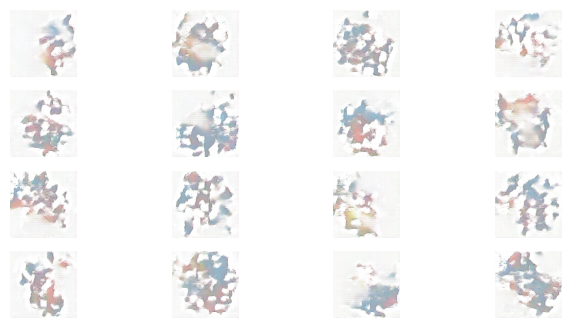

 90%|█████████ | 451/500 [1:04:18<07:50,  9.61s/it]

Time for epoch 451 is 10.834592819213867 sec
Training started with  epoch 452 with 7 batches..


 90%|█████████ | 452/500 [1:04:25<07:00,  8.75s/it]

Losses after epoch   452: generator 6.240, discriminator 0.111,               real_score 93.26%, fake_score 1.77%
Time for epoch 452 is 6.764060974121094 sec
Training started with  epoch 453 with 7 batches..


 91%|█████████ | 453/500 [1:04:35<07:12,  9.20s/it]

Losses after epoch   453: generator 5.031, discriminator 0.095,               real_score 95.30%, fake_score 3.38%
Time for epoch 453 is 10.243337154388428 sec
Training started with  epoch 454 with 7 batches..


 91%|█████████ | 454/500 [1:04:46<07:17,  9.51s/it]

Losses after epoch   454: generator 6.010, discriminator 0.020,               real_score 99.88%, fake_score 1.71%
Time for epoch 454 is 10.237122058868408 sec
Training started with  epoch 455 with 7 batches..


 91%|█████████ | 455/500 [1:04:53<06:33,  8.75s/it]

Losses after epoch   455: generator 5.052, discriminator 0.097,               real_score 99.99%, fake_score 5.53%
Time for epoch 455 is 6.974597215652466 sec
Training started with  epoch 456 with 7 batches..


 91%|█████████ | 456/500 [1:04:59<05:58,  8.15s/it]

Losses after epoch   456: generator 10.657, discriminator 0.002,               real_score 99.96%, fake_score 0.11%
Time for epoch 456 is 6.7296905517578125 sec
Training started with  epoch 457 with 7 batches..


 91%|█████████▏| 457/500 [1:05:10<06:17,  8.78s/it]

Losses after epoch   457: generator 1.357, discriminator 1.361,               real_score 100.00%, fake_score 49.83%
Time for epoch 457 is 10.242105960845947 sec
Training started with  epoch 458 with 7 batches..


 92%|█████████▏| 458/500 [1:05:20<06:26,  9.21s/it]

Losses after epoch   458: generator 5.886, discriminator 0.175,               real_score 95.43%, fake_score 4.22%
Time for epoch 458 is 10.234796047210693 sec
Training started with  epoch 459 with 7 batches..


 92%|█████████▏| 459/500 [1:05:30<06:30,  9.52s/it]

Losses after epoch   459: generator 0.757, discriminator 2.188,               real_score 100.00%, fake_score 65.69%
Time for epoch 459 is 10.233624696731567 sec
Training started with  epoch 460 with 7 batches..


 92%|█████████▏| 460/500 [1:05:40<06:29,  9.74s/it]

Losses after epoch   460: generator 3.589, discriminator 0.327,               real_score 97.96%, fake_score 16.41%
Time for epoch 460 is 10.234984636306763 sec
Training started with  epoch 461 with 7 batches..
Losses after epoch   461: generator 4.909, discriminator 0.114,               real_score 97.51%, fake_score 6.24%


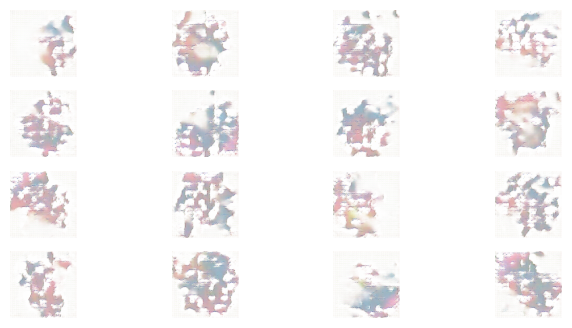

 92%|█████████▏| 461/500 [1:05:48<05:52,  9.04s/it]

Time for epoch 461 is 7.403501033782959 sec
Training started with  epoch 462 with 7 batches..


 92%|█████████▏| 462/500 [1:05:54<05:17,  8.35s/it]

Losses after epoch   462: generator 3.894, discriminator 0.195,               real_score 98.54%, fake_score 11.55%
Time for epoch 462 is 6.7490198612213135 sec
Training started with  epoch 463 with 7 batches..


 93%|█████████▎| 463/500 [1:06:01<04:51,  7.87s/it]

Losses after epoch   463: generator 3.254, discriminator 0.344,               real_score 98.62%, fake_score 17.42%
Time for epoch 463 is 6.72649884223938 sec
Training started with  epoch 464 with 7 batches..


 93%|█████████▎| 464/500 [1:06:08<04:31,  7.53s/it]

Losses after epoch   464: generator 4.611, discriminator 0.176,               real_score 92.35%, fake_score 5.67%
Time for epoch 464 is 6.756242990493774 sec
Training started with  epoch 465 with 7 batches..


 93%|█████████▎| 465/500 [1:06:18<04:52,  8.35s/it]

Losses after epoch   465: generator 3.402, discriminator 0.274,               real_score 97.35%, fake_score 15.14%
Time for epoch 465 is 10.242321729660034 sec
Training started with  epoch 466 with 7 batches..


 93%|█████████▎| 466/500 [1:06:25<04:28,  7.89s/it]

Losses after epoch   466: generator 4.819, discriminator 0.115,               real_score 95.05%, fake_score 4.72%
Time for epoch 466 is 6.828566312789917 sec
Training started with  epoch 467 with 7 batches..


 93%|█████████▎| 467/500 [1:06:35<04:43,  8.60s/it]

Losses after epoch   467: generator 4.990, discriminator 0.244,               real_score 87.72%, fake_score 5.06%
Time for epoch 467 is 10.241103887557983 sec
Training started with  epoch 468 with 7 batches..


 94%|█████████▎| 468/500 [1:06:45<04:50,  9.09s/it]

Losses after epoch   468: generator 11.738, discriminator 0.741,               real_score 64.25%, fake_score 0.01%
Time for epoch 468 is 10.235691785812378 sec
Training started with  epoch 469 with 7 batches..


 94%|█████████▍| 469/500 [1:06:52<04:19,  8.38s/it]

Losses after epoch   469: generator 6.227, discriminator 0.026,               real_score 99.15%, fake_score 1.67%
Time for epoch 469 is 6.7259135246276855 sec
Training started with  epoch 470 with 7 batches..


 94%|█████████▍| 470/500 [1:07:02<04:28,  8.94s/it]

Losses after epoch   470: generator 4.732, discriminator 0.074,               real_score 98.02%, fake_score 4.56%
Time for epoch 470 is 10.2358980178833 sec
Training started with  epoch 471 with 7 batches..
Losses after epoch   471: generator 5.531, discriminator 0.045,               real_score 98.03%, fake_score 2.11%


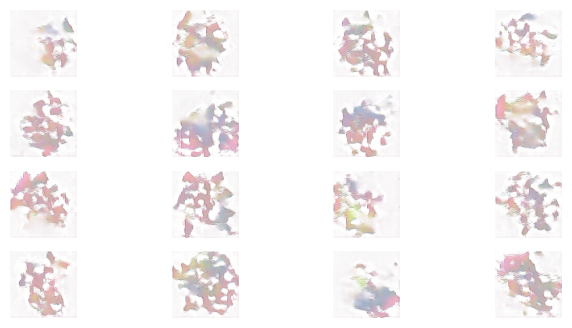

 94%|█████████▍| 471/500 [1:07:14<04:38,  9.60s/it]

Time for epoch 471 is 11.135364532470703 sec
Training started with  epoch 472 with 7 batches..


 94%|█████████▍| 472/500 [1:07:20<04:04,  8.74s/it]

Losses after epoch   472: generator 4.885, discriminator 0.097,               real_score 97.35%, fake_score 4.47%
Time for epoch 472 is 6.733569860458374 sec
Training started with  epoch 473 with 7 batches..


 95%|█████████▍| 473/500 [1:07:31<04:08,  9.19s/it]

Losses after epoch   473: generator 5.083, discriminator 0.094,               real_score 98.30%, fake_score 5.62%
Time for epoch 473 is 10.24203372001648 sec
Training started with  epoch 474 with 7 batches..


 95%|█████████▍| 474/500 [1:07:37<03:40,  8.47s/it]

Losses after epoch   474: generator 4.478, discriminator 0.074,               real_score 99.86%, fake_score 5.24%
Time for epoch 474 is 6.785934686660767 sec
Training started with  epoch 475 with 7 batches..


 95%|█████████▌| 475/500 [1:07:44<03:18,  7.92s/it]

Losses after epoch   475: generator 6.393, discriminator 0.064,               real_score 96.79%, fake_score 1.89%
Time for epoch 475 is 6.640951633453369 sec
Training started with  epoch 476 with 7 batches..


 95%|█████████▌| 476/500 [1:07:51<03:01,  7.56s/it]

Losses after epoch   476: generator 5.522, discriminator 0.070,               real_score 96.89%, fake_score 2.99%
Time for epoch 476 is 6.712600469589233 sec
Training started with  epoch 477 with 7 batches..


 95%|█████████▌| 477/500 [1:08:01<03:12,  8.36s/it]

Losses after epoch   477: generator 5.002, discriminator 0.051,               real_score 98.79%, fake_score 3.41%
Time for epoch 477 is 10.237055778503418 sec
Training started with  epoch 478 with 7 batches..


 96%|█████████▌| 478/500 [1:08:11<03:16,  8.93s/it]

Losses after epoch   478: generator 5.090, discriminator 0.065,               real_score 98.30%, fake_score 3.94%
Time for epoch 478 is 10.244272470474243 sec
Training started with  epoch 479 with 7 batches..


 96%|█████████▌| 479/500 [1:08:21<03:15,  9.33s/it]

Losses after epoch   479: generator 4.781, discriminator 0.072,               real_score 97.40%, fake_score 3.69%
Time for epoch 479 is 10.248967170715332 sec
Training started with  epoch 480 with 7 batches..


 96%|█████████▌| 480/500 [1:08:32<03:12,  9.60s/it]

Losses after epoch   480: generator 4.822, discriminator 0.080,               real_score 97.32%, fake_score 4.09%
Time for epoch 480 is 10.240532875061035 sec
Training started with  epoch 481 with 7 batches..
Losses after epoch   481: generator 5.665, discriminator 0.101,               real_score 93.16%, fake_score 1.52%


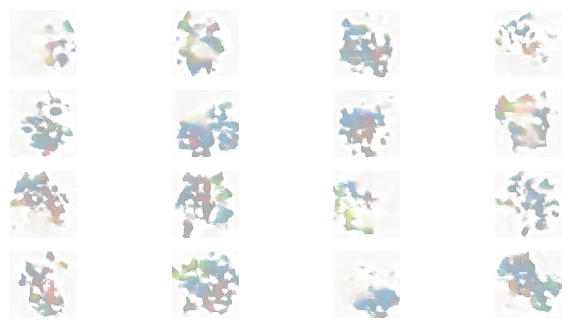

 96%|█████████▌| 481/500 [1:08:39<02:50,  8.99s/it]

Time for epoch 481 is 7.561646938323975 sec
Training started with  epoch 482 with 7 batches..


 96%|█████████▋| 482/500 [1:08:46<02:29,  8.33s/it]

Losses after epoch   482: generator 5.017, discriminator 0.089,               real_score 96.11%, fake_score 3.54%
Time for epoch 482 is 6.774987697601318 sec
Training started with  epoch 483 with 7 batches..


 97%|█████████▋| 483/500 [1:08:53<02:13,  7.86s/it]

Losses after epoch   483: generator 5.102, discriminator 0.061,               real_score 97.20%, fake_score 2.86%
Time for epoch 483 is 6.764511585235596 sec
Training started with  epoch 484 with 7 batches..


 97%|█████████▋| 484/500 [1:09:00<02:00,  7.52s/it]

Losses after epoch   484: generator 5.273, discriminator 0.062,               real_score 96.95%, fake_score 2.61%
Time for epoch 484 is 6.737681150436401 sec
Training started with  epoch 485 with 7 batches..


 97%|█████████▋| 485/500 [1:09:10<02:05,  8.34s/it]

Losses after epoch   485: generator 6.325, discriminator 0.123,               real_score 91.77%, fake_score 1.21%
Time for epoch 485 is 10.23954176902771 sec
Training started with  epoch 486 with 7 batches..


 97%|█████████▋| 486/500 [1:09:20<02:04,  8.91s/it]

Losses after epoch   486: generator 3.843, discriminator 0.120,               real_score 99.56%, fake_score 8.60%
Time for epoch 486 is 10.234683752059937 sec
Training started with  epoch 487 with 7 batches..


 97%|█████████▋| 487/500 [1:09:30<02:00,  9.31s/it]

Losses after epoch   487: generator 6.183, discriminator 0.069,               real_score 95.02%, fake_score 1.11%
Time for epoch 487 is 10.233569145202637 sec
Training started with  epoch 488 with 7 batches..


 98%|█████████▊| 488/500 [1:09:40<01:55,  9.59s/it]

Losses after epoch   488: generator 5.875, discriminator 0.078,               real_score 95.11%, fake_score 2.18%
Time for epoch 488 is 10.235612869262695 sec
Training started with  epoch 489 with 7 batches..


 98%|█████████▊| 489/500 [1:09:51<01:47,  9.78s/it]

Losses after epoch   489: generator 5.403, discriminator 0.069,               real_score 97.27%, fake_score 3.22%
Time for epoch 489 is 10.238115787506104 sec
Training started with  epoch 490 with 7 batches..


 98%|█████████▊| 490/500 [1:10:01<01:39,  9.92s/it]

Losses after epoch   490: generator 5.686, discriminator 0.054,               real_score 96.89%, fake_score 1.96%
Time for epoch 490 is 10.240688562393188 sec
Training started with  epoch 491 with 7 batches..
Losses after epoch   491: generator 6.247, discriminator 0.064,               real_score 95.35%, fake_score 1.07%


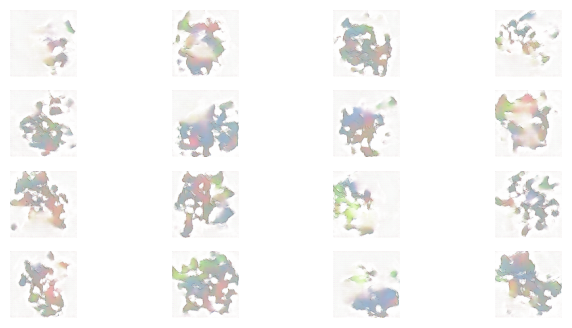

 98%|█████████▊| 491/500 [1:10:09<01:22,  9.21s/it]

Time for epoch 491 is 7.533679246902466 sec
Training started with  epoch 492 with 7 batches..


 98%|█████████▊| 492/500 [1:10:15<01:07,  8.45s/it]

Losses after epoch   492: generator 6.839, discriminator 0.166,               real_score 88.55%, fake_score 0.70%
Time for epoch 492 is 6.680578231811523 sec
Training started with  epoch 493 with 7 batches..


 99%|█████████▊| 493/500 [1:10:25<01:02,  8.99s/it]

Losses after epoch   493: generator 5.494, discriminator 0.053,               real_score 97.39%, fake_score 2.29%
Time for epoch 493 is 10.239001750946045 sec
Training started with  epoch 494 with 7 batches..


 99%|█████████▉| 494/500 [1:10:32<00:49,  8.31s/it]

Losses after epoch   494: generator 5.581, discriminator 0.066,               real_score 95.64%, fake_score 1.66%
Time for epoch 494 is 6.73002552986145 sec
Training started with  epoch 495 with 7 batches..


 99%|█████████▉| 495/500 [1:10:42<00:44,  8.89s/it]

Losses after epoch   495: generator 5.270, discriminator 0.059,               real_score 97.63%, fake_score 2.87%
Time for epoch 495 is 10.243458986282349 sec
Training started with  epoch 496 with 7 batches..


 99%|█████████▉| 496/500 [1:10:53<00:37,  9.30s/it]

Losses after epoch   496: generator 4.419, discriminator 0.089,               real_score 98.32%, fake_score 5.39%
Time for epoch 496 is 10.241084337234497 sec
Training started with  epoch 497 with 7 batches..


 99%|█████████▉| 497/500 [1:11:03<00:28,  9.58s/it]

Losses after epoch   497: generator 6.386, discriminator 0.092,               real_score 93.48%, fake_score 0.99%
Time for epoch 497 is 10.234395980834961 sec
Training started with  epoch 498 with 7 batches..


100%|█████████▉| 498/500 [1:11:13<00:19,  9.78s/it]

Losses after epoch   498: generator 5.896, discriminator 0.065,               real_score 96.34%, fake_score 1.40%
Time for epoch 498 is 10.233955144882202 sec
Training started with  epoch 499 with 7 batches..


100%|█████████▉| 499/500 [1:11:23<00:09,  9.91s/it]

Losses after epoch   499: generator 5.951, discriminator 0.076,               real_score 95.59%, fake_score 2.19%
Time for epoch 499 is 10.236356496810913 sec
Training started with  epoch 500 with 7 batches..


100%|██████████| 500/500 [1:11:30<00:00,  8.58s/it]

Losses after epoch   500: generator 5.652, discriminator 0.045,               real_score 98.30%, fake_score 2.46%
Time for epoch 500 is 6.709896564483643 sec


In [25]:
# Entrenamiento del modelo
gen_loss_epochs, disc_loss_epochs, real_score_list, fake_score_list = train(dataset, epochs = epochs)

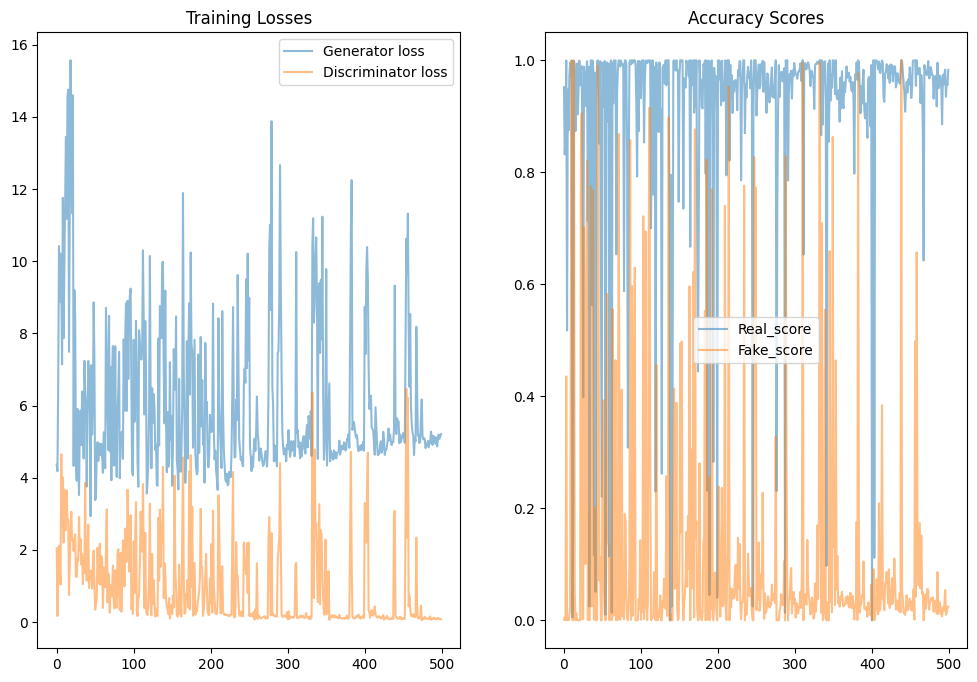

In [26]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize = (12, 8))

ax1.plot(gen_loss_epochs, label = 'Generator loss', alpha = 0.5)
ax1.plot(disc_loss_epochs, label = 'Discriminator loss', alpha = 0.5)
ax1.legend()
ax1.set_title('Training Losses')

ax2.plot(real_score_list, label = 'Real_score', alpha = 0.5)
ax2.plot(fake_score_list, label = 'Fake_score', alpha = 0.5)
ax2.set_title('Accuracy Scores')

ax2.legend()

(1, 256, 256, 3)


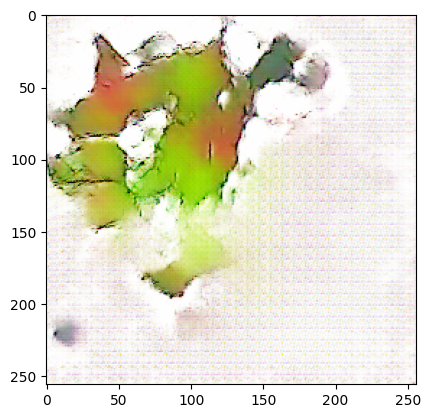

In [27]:
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training = False)
print(generated_image.shape)
plt.imshow((generated_image[0, :, :, :]))

Desafíos encontrados:
La generación de imágenes con una GAN plantea desafíos únicos, como la creación de imágenes realistas y coherentes que representen fielmente el dominio de interés. En el contexto específico de las GANs para la generación de imágenes de Pokémon, nos enfrentamos a desafíos adicionales debido a la diversidad y complejidad de los diseños de los Pokémon, que no siempre siguen patrones definidos. Esto implica que el modelo debe aprender una amplia variedad de características y relaciones entre ellas para generar imágenes que sean reconocibles como Pokémon y que mantengan la estética y el estilo de la franquicia.

Para abordar este desafío, se implementaron las siguientes medidas:

- Conjunto de datos diverso: Se seleccionó un conjunto de datos que incluye una amplia variedad de Pokémon, abarcando diferentes especies, tipos y estilos de diseño. Esto asegura que el modelo tenga acceso a una gama representativa de características y estilos para aprender y generar imágenes diversas y realistas.
  
- Arquitectura GAN compleja: Se utilizó una arquitectura GAN con capas profundas y complejas, lo que permite al modelo capturar detalles finos y relaciones complejas entre los diferentes elementos de los Pokémon. Esta arquitectura robusta es crucial para generar imágenes de alta calidad y coherentes que mantengan la fidelidad con el diseño original de los Pokémon.
  
- Entrenamiento exhaustivo: Se llevó a cabo un entrenamiento prolongado del modelo, lo que permitió que aprendiera las sutilezas de los diseños de Pokémon y las relaciones entre diferentes características. Este entrenamiento extenso es fundamental para que el modelo capture las complejidades del dominio y genere imágenes que sean visualmente convincentes y coherentes con la franquicia Pokémon.

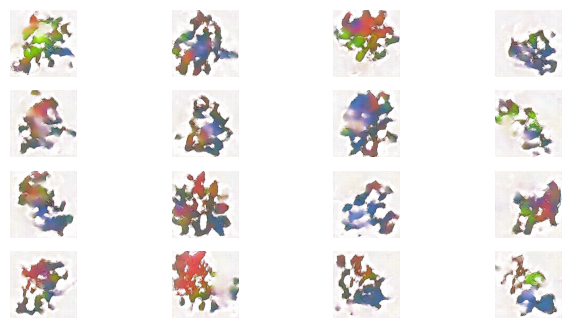

In [28]:
# Mostramos ejemplos de pokemones generados
test_input = tf.random.normal([num_examples_to_generate, noise_dim])

predictions = generator(test_input, training = False)

fig = plt.figure(figsize = (8, 4))

for i in range(predictions.shape[0]):
    plt.subplot(4, 4, i + 1)
    plt.imshow((predictions[i, :, :, :]))
    plt.axis('off')
plt.show()